In [1]:
import pandas as pd 
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', None)

## Dataset Info

In [3]:
#!wget https://raw.githubusercontent.com/ivtipm/ML/main/datasets/churn.csv -O churn.csv

In [140]:
df = pd.read_csv("churn.csv")
df

,churn,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   churn                     10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [6]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [7]:
print(f"Duplicates: №{df.duplicated().sum()}")

Duplicates: №0


## Features description

* Customer_Age - Возраст клиента в годах
* Gender - Пол
* Dependent_count - Количество иждивенцев
* Education_Level - Уровень образования
* Marital_Status - Семейный статус
* Income_Category - Уровень дохода
* Card_Category - Тип кредитной карты (Blue, Silver, Gold, Platinum)
* Months_on_book - Период взаимоотношений с банком
* Total_Relationship_Count - Общее количество продуктов, имеющихся у клиента
* Months_Inactive_12_mon  - Количество месяцев неактивности клиента за последние 12 месяцев
* Contacts_Count_12_mon - Количество контактов за последние 12 месяцев
* Credit_Limit - Кредитный лимит на кредитной карте
* Total_Revolving_Bal - Общий возобновляемый остаток на кредитной карте
* Avg_Open_To_Buy - Среднее значение открыта кредитная линия на покупку
* Total_Amt_Chng_Q4_Q1 - Изменение суммы транзакции (4 квартал по сравнению с 1 кварталом)
* Total_Trans_Amt - Общая сумма транзакций
* Total_Trans_Ct - Общее количество транзакций
* Total_Ct_Chng_Q4_Q1 - Изменение количества транзакций (4 квартал по сравнению с 1 кварталом)
* Avg_Utilization_Ratio - Средний коэффициент использования карты

## Graphs

Классы несбалансированны:

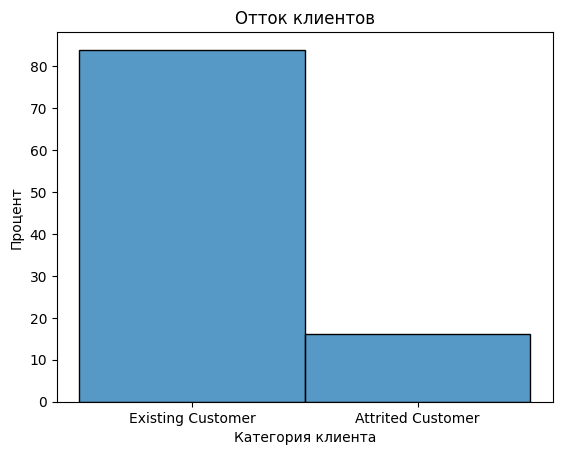

churn
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

In [8]:
sb.histplot(df['churn'], discrete=True, stat='percent').set(title='Отток клиентов', xlabel='Категория клиента', ylabel='Процент')
plt.show()
df['churn'].value_counts()

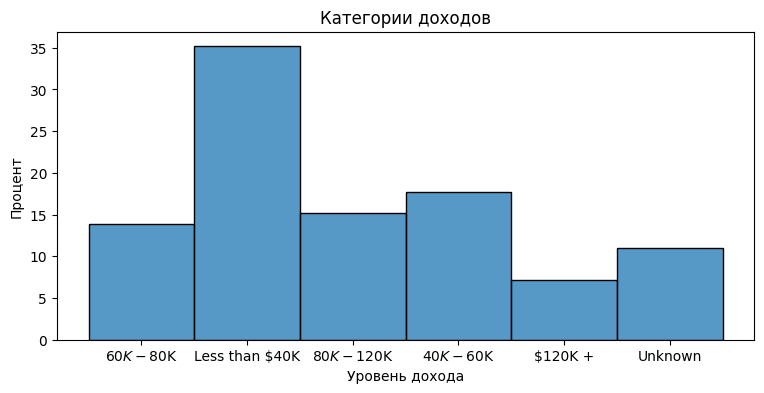

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64

In [9]:
plt.figure(figsize=(9,4))
sb.histplot(df['Income_Category'], discrete=True, stat='percent').set(title='Категории доходов', xlabel='Уровень дохода', ylabel='Процент')
plt.show()
df['Income_Category'].value_counts()

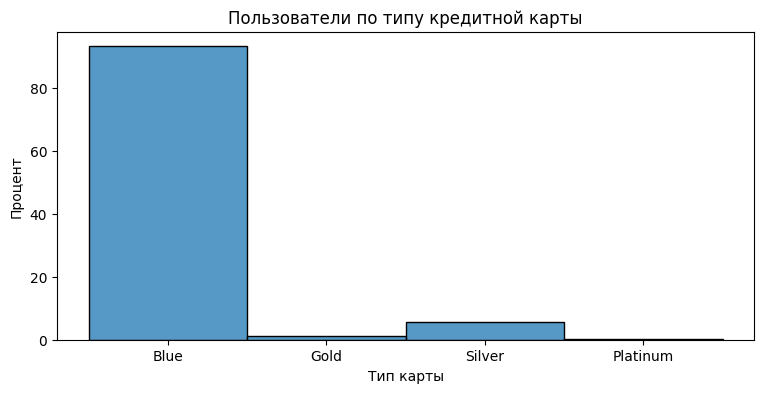

Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64

In [10]:
plt.figure(figsize=(9,4))
sb.histplot(df['Card_Category'], discrete=True, stat='percent').set(title='Пользователи по типу кредитной карты', xlabel='Тип карты', ylabel='Процент')
plt.show()
df['Card_Category'].value_counts()

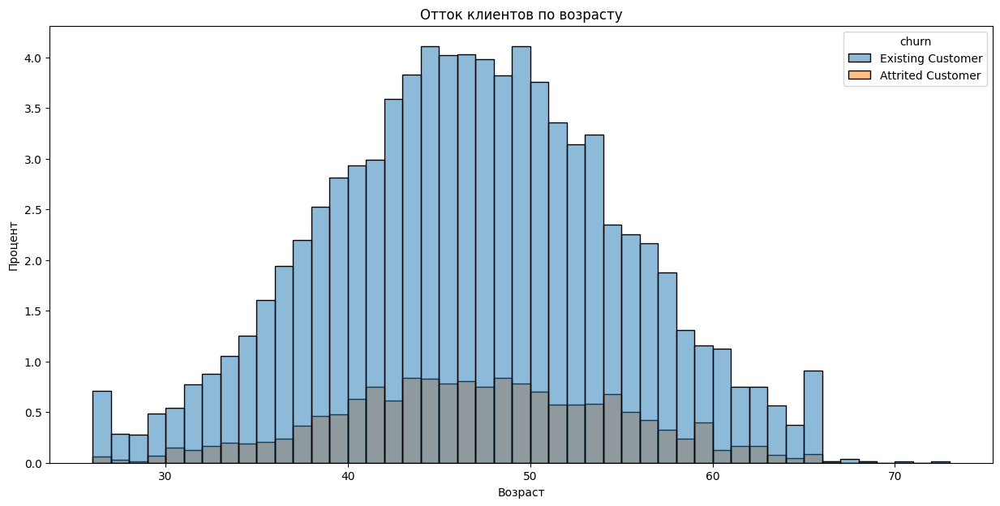

In [11]:
plt.figure(figsize=(15,7))
sb.histplot(data=df, x='Customer_Age', hue='churn', stat='percent').set(title='Отток клиентов по возрасту', xlabel='Возраст', ylabel='Процент')
plt.show()

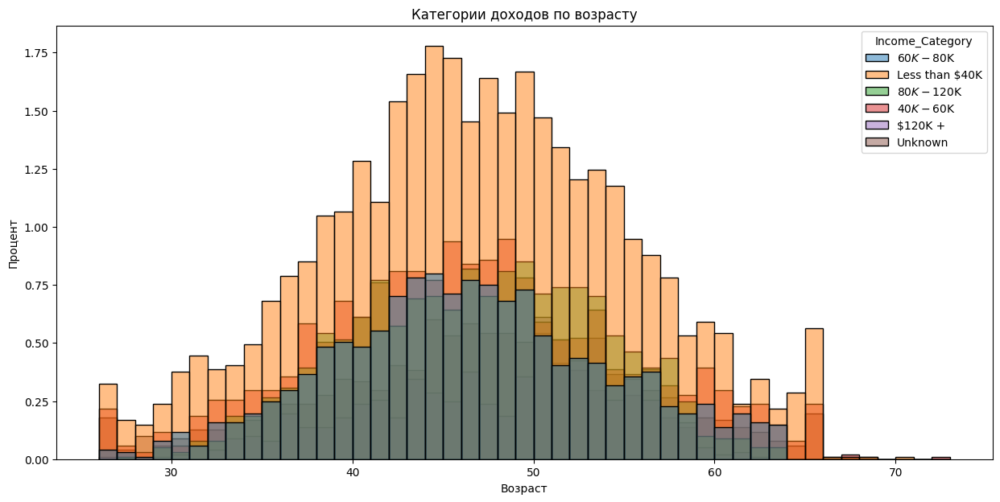

In [12]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Customer_Age', hue='Income_Category', stat='percent').set(title='Категории доходов по возрасту', xlabel='Возраст', ylabel='Процент')
plt.show()

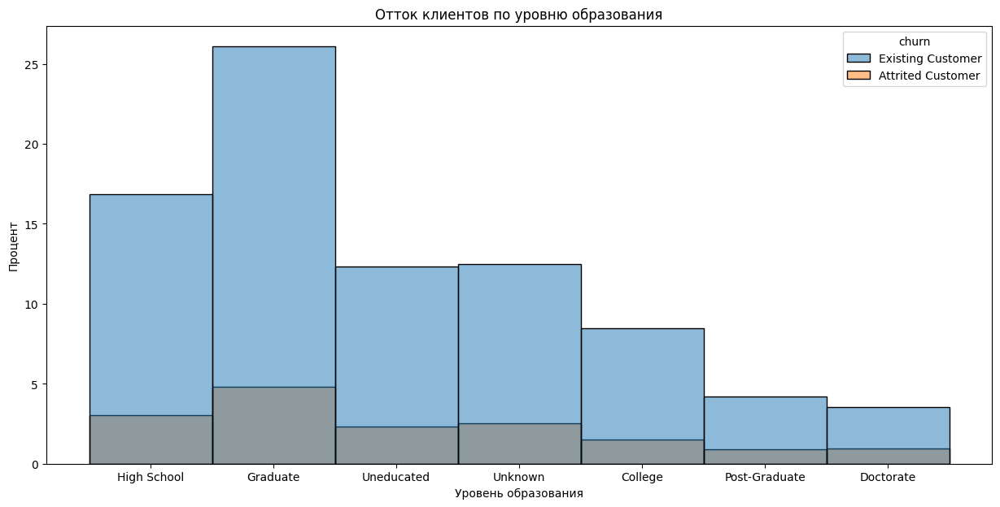

In [13]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Education_Level', hue='churn', stat='percent').set(title='Отток клиентов по уровню образования', xlabel='Уровень образования', ylabel='Процент')
plt.show()

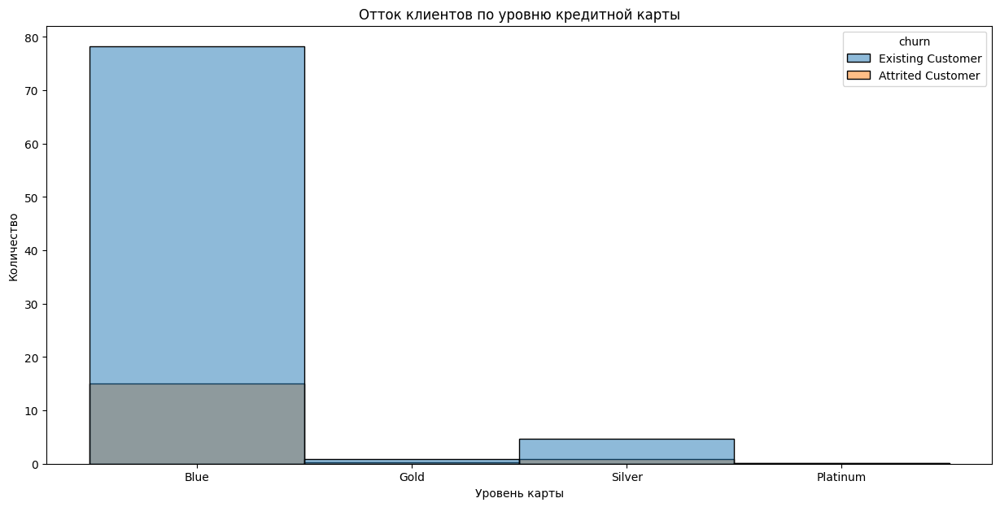

In [14]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Card_Category', hue='churn', stat='percent').set(title='Отток клиентов по уровню кредитной карты', xlabel='Уровень карты', ylabel='Количество')
plt.show()

### Примеры запросов

Клиенты с Silver картами уходят реже,чем с Blue. Для остальных видов карт слишком мало владельцев.

In [15]:
def count_card_ratio(card_name):
    all_card_holders = sum((df['Card_Category'] == card_name))
    wcard_and_attired = sum((df['Card_Category'] == card_name) & (df['churn'] == 'Attrited Customer'))
    wcard_and_existing = sum((df['Card_Category'] == card_name) & (df['churn'] == 'Existing Customer'))
    
    print(f"Cоотношение ушедших к существующим держателям карты {card_name}: {wcard_and_attired/wcard_and_existing:1.4} (меньше-лучше)")
    print(f"Процент ушедших от всех держателей карты {card_name}: {wcard_and_attired/all_card_holders * 100:2.3} (меньше-лучше)\n")


for v in df['Card_Category'].unique():
    count_card_ratio(v)

Cоотношение ушедших к существующим держателям карты Blue: 0.1919 (меньше-лучше)
Процент ушедших от всех держателей карты Blue: 16.1 (меньше-лучше)

Cоотношение ушедших к существующим держателям карты Gold: 0.2211 (меньше-лучше)
Процент ушедших от всех держателей карты Gold: 18.1 (меньше-лучше)

Cоотношение ушедших к существующим держателям карты Silver: 0.1734 (меньше-лучше)
Процент ушедших от всех держателей карты Silver: 14.8 (меньше-лучше)

Cоотношение ушедших к существующим держателям карты Platinum: 0.3333 (меньше-лучше)
Процент ушедших от всех держателей карты Platinum: 25.0 (меньше-лучше)



In [144]:
# Все клиенты с платинум картой и максимальной категорией доходов
df[(df['Card_Category'] == 'Platinum') & (df['Income_Category'] == '$120K +')]

,churn,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
8631,Existing Customer,51,M,0,Doctorate,Single,$120K +,Platinum,44,3,2,3,34516.0,1925,32591.0,0.764,8012,87,0.582,0.056
8897,Existing Customer,45,M,4,Graduate,Single,$120K +,Platinum,34,2,2,1,34516.0,1488,33028.0,0.732,7281,95,0.532,0.043
9306,Existing Customer,44,M,2,Uneducated,Married,$120K +,Platinum,36,2,1,3,34516.0,1421,33095.0,0.744,14465,114,0.754,0.041
9618,Existing Customer,42,M,3,Uneducated,Married,$120K +,Platinum,23,3,4,3,34516.0,2070,32446.0,0.880,13781,102,0.545,0.060


In [145]:
# Все клиенты с платинум картой и любой другой категорией доходов, кроме макисмальной
df[(df['Card_Category'] == 'Platinum') & (df['Income_Category'] != '$120K +')]

,churn,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
443,Existing Customer,48,M,3,Graduate,Unknown,$80K - $120K,Platinum,41,3,2,2,34516.0,1531,32985.0,0.862,1156,29,1.071,0.044
650,Existing Customer,51,F,3,Post-Graduate,Divorced,Unknown,Platinum,34,3,1,2,34516.0,1578,32938.0,0.725,1929,40,0.481,0.046
3800,Attrited Customer,51,F,2,Doctorate,Married,Less than $40K,Platinum,42,3,2,3,15987.0,193,15794.0,0.435,2021,46,0.394,0.012
8863,Attrited Customer,43,M,3,Post-Graduate,Married,$40K - $60K,Platinum,31,2,3,4,23981.0,593,23388.0,0.987,4758,65,0.512,0.025
9068,Attrited Customer,54,F,0,Graduate,Single,Unknown,Platinum,38,2,2,2,34516.0,0,34516.0,0.695,3901,54,0.421,0.000
9071,Existing Customer,41,M,4,Unknown,Married,$60K - $80K,Platinum,26,1,1,2,34516.0,1559,32957.0,0.759,8888,104,0.763,0.045
9078,Existing Customer,39,F,1,Unknown,Single,Less than $40K,Platinum,35,1,2,3,15987.0,1494,14493.0,0.731,8438,92,0.840,0.093
9102,Attrited Customer,51,F,2,Graduate,Single,Unknown,Platinum,32,2,3,3,34516.0,531,33985.0,0.980,5418,65,0.711,0.015
9113,Existing Customer,45,M,2,Graduate,Married,$60K - $80K,Platinum,31,2,2,1,34516.0,1308,33208.0,0.746,8773,105,0.780,0.038
9127,Existing Customer,56,F,3,Uneducated,Single,Unknown,Platinum,46,2,3,2,34516.0,0,34516.0,0.887,8416,93,0.632,0.000


In [147]:
# Люди без образования, состоящие в браке
df[(df['Marital_Status'] == 'Married') & (df['Education_Level'] == 'Uneducated')]

,churn,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
98,Existing Customer,56,M,3,College,Married,$120K +,Blue,50,3,2,0,9689.0,2250,7439.0,0.576,1158,19,0.727,0.232
124,Existing Customer,55,M,2,College,Single,$120K +,Silver,42,2,3,2,34516.0,1527,32989.0,0.526,1268,42,0.355,0.044
209,Existing Customer,58,M,2,College,Married,$120K +,Blue,53,2,3,0,24407.0,2395,22012.0,1.071,2311,48,0.714,0.098
408,Existing Customer,51,M,4,College,Married,$120K +,Silver,31,5,2,1,34516.0,1254,33262.0,0.869,1366,25,0.786,0.036
473,Attrited Customer,56,M,2,College,Single,$120K +,Blue,50,2,2,3,16867.0,0,16867.0,0.885,654,14,0.400,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9257,Existing Customer,51,M,2,College,Single,$120K +,Blue,36,2,2,2,3477.0,752,2725.0,0.703,13627,120,0.739,0.216
9290,Existing Customer,51,M,4,College,Single,$120K +,Gold,33,2,2,2,34516.0,1848,32668.0,0.775,14149,103,0.689,0.054
9845,Existing Customer,51,M,3,College,Married,$120K +,Blue,40,3,3,2,34516.0,1476,33040.0,0.763,14145,119,0.776,0.043
9943,Attrited Customer,52,M,2,College,Single,$120K +,Blue,32,4,3,1,4935.0,0,4935.0,0.713,7886,64,0.882,0.000


In [151]:
# Людей с высокой зарплатой, но без образования в колледже больше, чем людей с высокой зарплатой и образованием в колледже
college_high_salary = len(df[(df['Income_Category'] == '$120K +') & (df['Education_Level'] == 'College')])
nocollege_high_salary = len(df[(df['Income_Category'] == '$120K +') & (df['Education_Level'] != 'College')])
print(f" {college_high_salary} {nocollege_high_salary}")

 70 657


In [152]:
# Женщин без семейного статуса больше, чем мужчин
single_females = len(df[(df['Gender'] == 'F') & (df['Marital_Status'] == 'Single')])
single_males = len(df[(df['Gender'] == 'M') & (df['Marital_Status'] == 'Single')])
print(f" {single_females} {single_males}")

 2125 1818


In [154]:
# Женщин с доходами более $80K не нашлось
rich_females = len(df[(df['Gender'] == 'F') & ((df['Income_Category'] == '$120K +') | (df['Income_Category'] == '$80K - $120K'))])
rich_males = len(df[(df['Gender'] == 'M') & ((df['Income_Category'] == '$120K +') | (df['Income_Category'] == '$80K - $120K'))])
print(f" {rich_females} {rich_males}")

 0 2262


In [159]:
print("Среднее число контактов людей без семейного статуса: ")
print(np.mean(df[df['Marital_Status'] == 'Single']['Contacts_Count_12_mon']))
print("Среднее число контактов людей в браке: ")
print(np.mean(df[df['Marital_Status'] == 'Married']['Contacts_Count_12_mon']))

Среднее число контактов людей без семейного статуса: 
2.4663961450672076
Среднее число контактов людей в браке: 
2.4572221036910604


In [160]:
print("Средний объем переводов людей с платинум картой: ")
print(np.mean(df[df['Card_Category'] == 'Platinum']['Total_Trans_Amt']))
print("Средний объем переводов людей без платинум карты: ")
print(np.mean(df[df['Card_Category'] != 'Platinum']['Total_Trans_Amt']))

Средний объем переводов людей с платинум картой: 
8999.75
Средний объем переводов людей без платинум карты: 
4394.992282576432


Клиенты с низким объемом и количеством переводов уходят чаще:

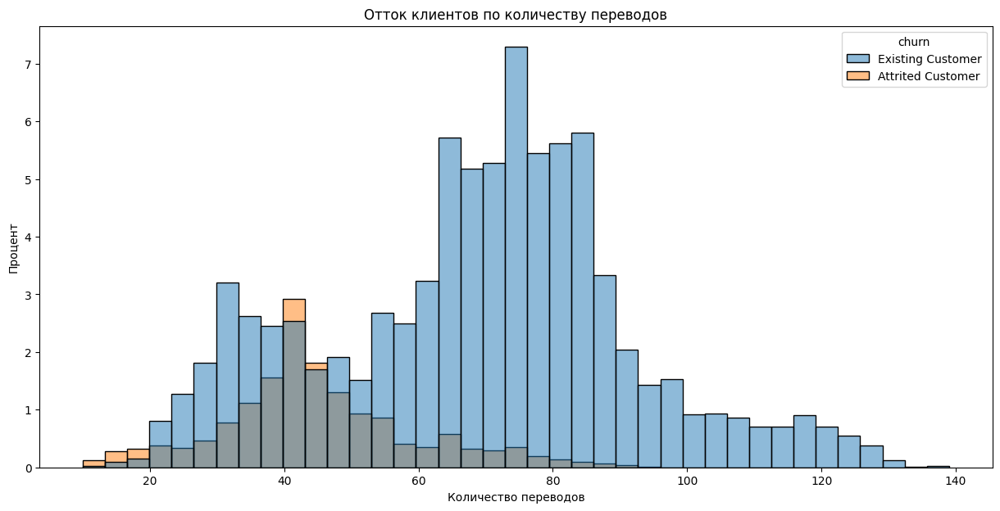

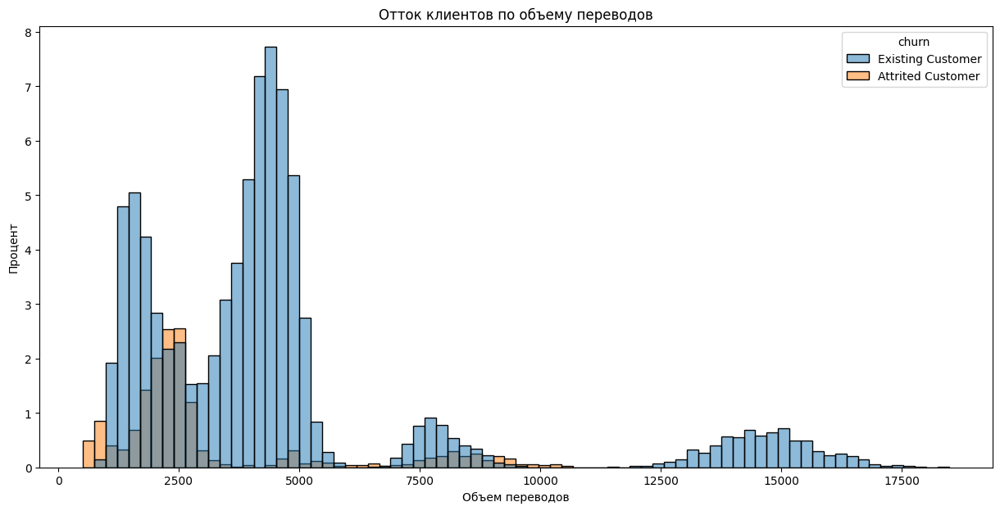

In [16]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Total_Trans_Ct', hue='churn', stat='percent').set(title='Отток клиентов по количеству переводов', xlabel='Количество переводов', ylabel='Процент')
plt.show()
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Total_Trans_Amt', hue='churn', stat='percent').set(title='Отток клиентов по объему переводов', xlabel='Объем переводов', ylabel='Процент')
plt.show()

Клиенты с низким кредитным лимитом чаще уходят.

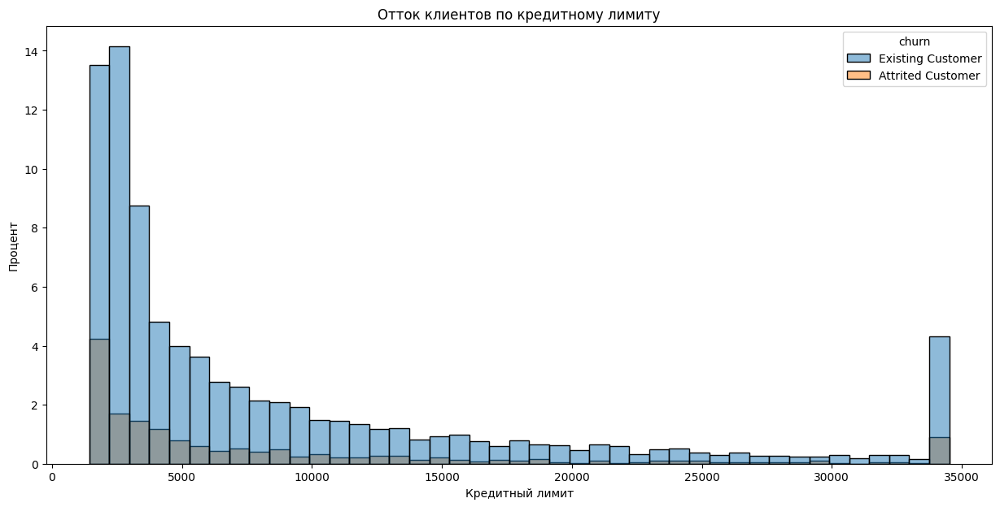

In [17]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Credit_Limit', hue='churn', stat='percent').set(title='Отток клиентов по кредитному лимиту', xlabel='Кредитный лимит', ylabel='Процент')
plt.show()

Крединтный лимит, в свою очередь, зависит от уровня дохода.

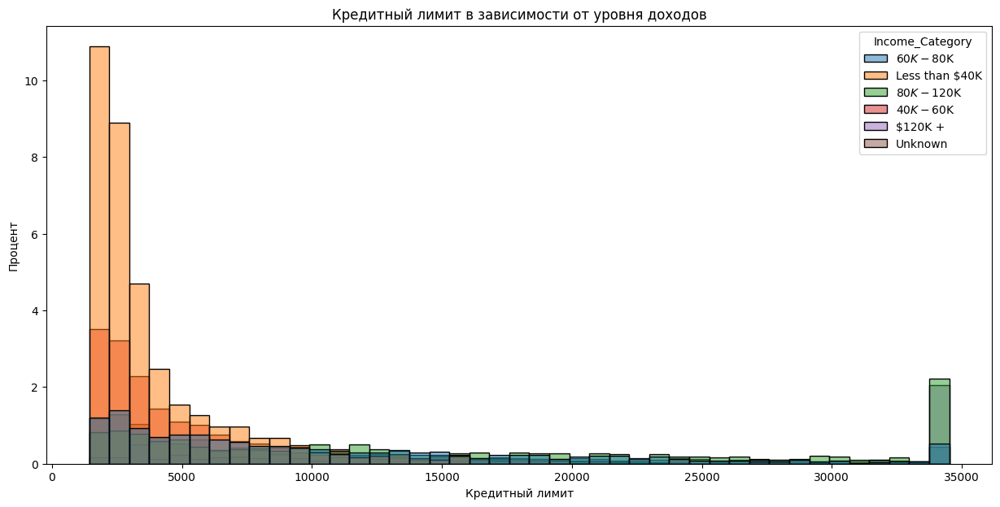

In [18]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Credit_Limit', hue='Income_Category', stat='percent').set(title='Кредитный лимит в зависимости от уровня доходов', xlabel='Кредитный лимит', ylabel='Процент')
plt.show()

Сильное уменьшение количества транзакций (< 1) значительно влияет на уход клиента.

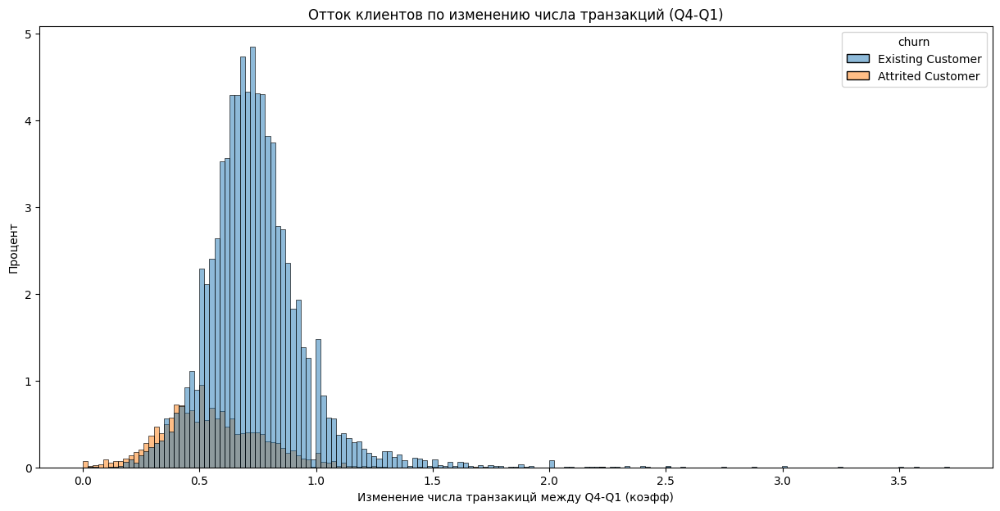

In [19]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Total_Ct_Chng_Q4_Q1', hue='churn', stat='percent').set(title='Отток клиентов по изменению числа транзакций (Q4-Q1)', xlabel='Изменение числа транзакицй между Q4-Q1 (коэфф)', ylabel='Процент')
plt.show()

Те, кто почти не пользуются кредитным балансом, чаще отказываются от услуг:

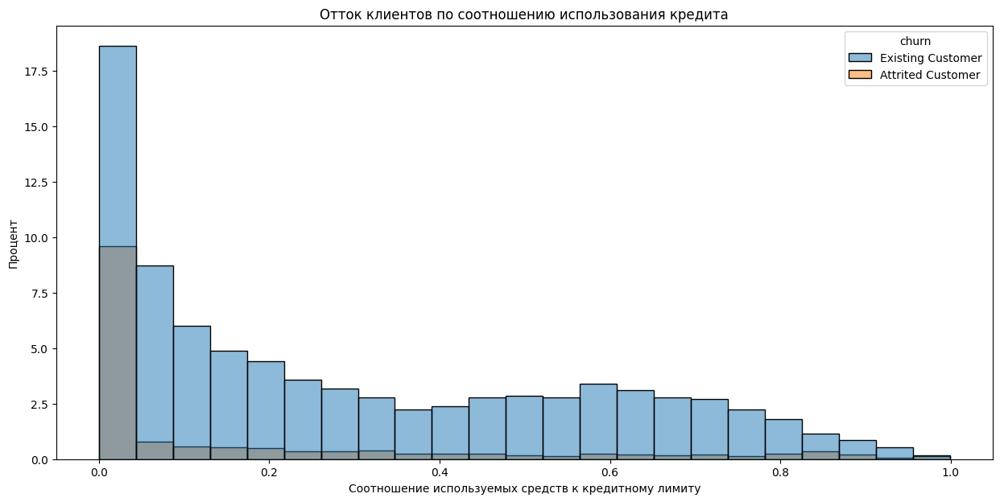

In [20]:
plt.figure(figsize=(15,7))
sb.histplot( data=df, x='Avg_Utilization_Ratio', hue='churn', stat='percent').set(title='Отток клиентов по соотношению использования кредита', xlabel='Соотношение используемых средств к кредитному лимиту', ylabel='Процент')
plt.show()

In [21]:
def get_numerical_cols(df: pd.DataFrame) -> list:
    """Получить все числовые колонки из pd.DataFrame"""    
    return df.columns[df.dtypes!=object].tolist()  

def get_obj_cols(df: pd.DataFrame) -> list:
    """Получить все объектные колонки из pd.DataFrame"""    
    return df.columns[df.dtypes==object].tolist()

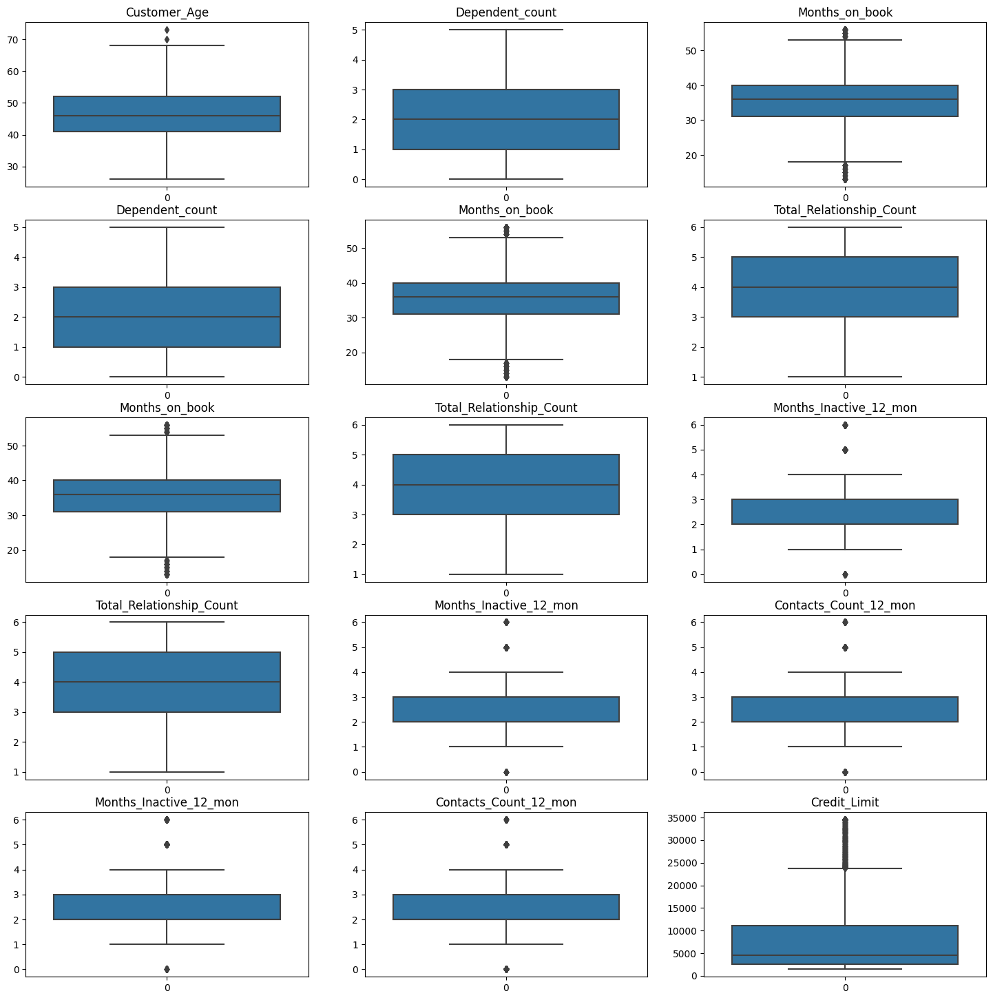

In [22]:
from math import ceil

def box_plot_all(dataframe: pd.DataFrame):
    num_cols = get_numerical_cols(dataframe)
    n_num_cols = len(num_cols)    
    ncols = 3
    nrows = ceil(n_num_cols/ncols)    

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(18, 18))
    for r in np.arange(0, nrows):
        for c in range(0, ncols):
            sb.boxplot(dataframe[num_cols[r+c]].values, ax=axs[r, c]).set_title(num_cols[r+c])                
        
box_plot_all(df)

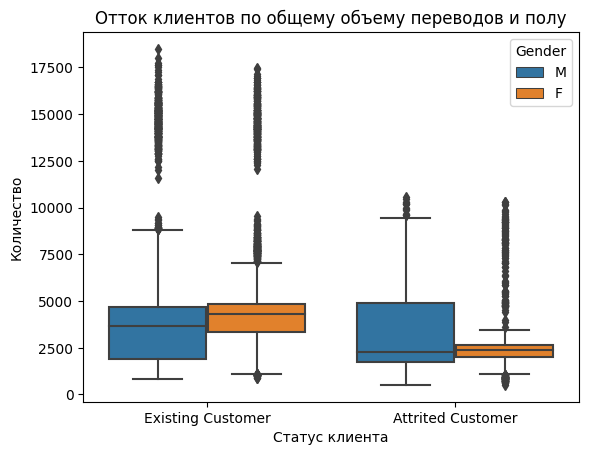

In [23]:
sb.boxplot(data = df, x = 'churn', y='Total_Trans_Amt', hue='Gender').set(title='Отток клиентов по общему объему переводов и полу', xlabel='Статус клиента', ylabel='Количество')
plt.show()

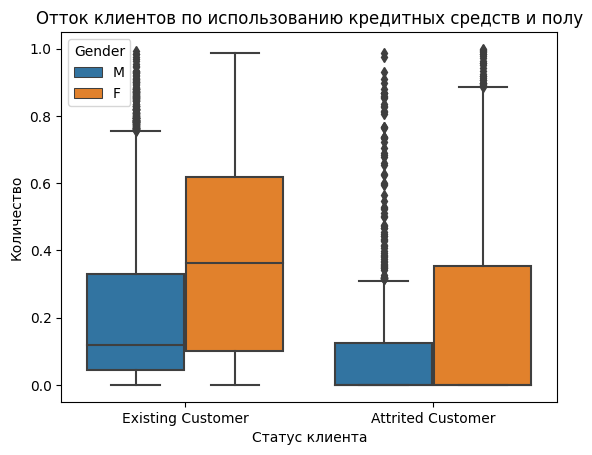

In [24]:
sb.boxplot(data = df, x = 'churn', y='Avg_Utilization_Ratio', hue='Gender').set(title='Отток клиентов по использованию кредитных средств и полу', xlabel='Статус клиента', ylabel='Количество')
plt.show()

In [25]:
#sb.violinplot(x=df["Total_Revolving_Bal"])

### Попарные диаграммы рассеивания

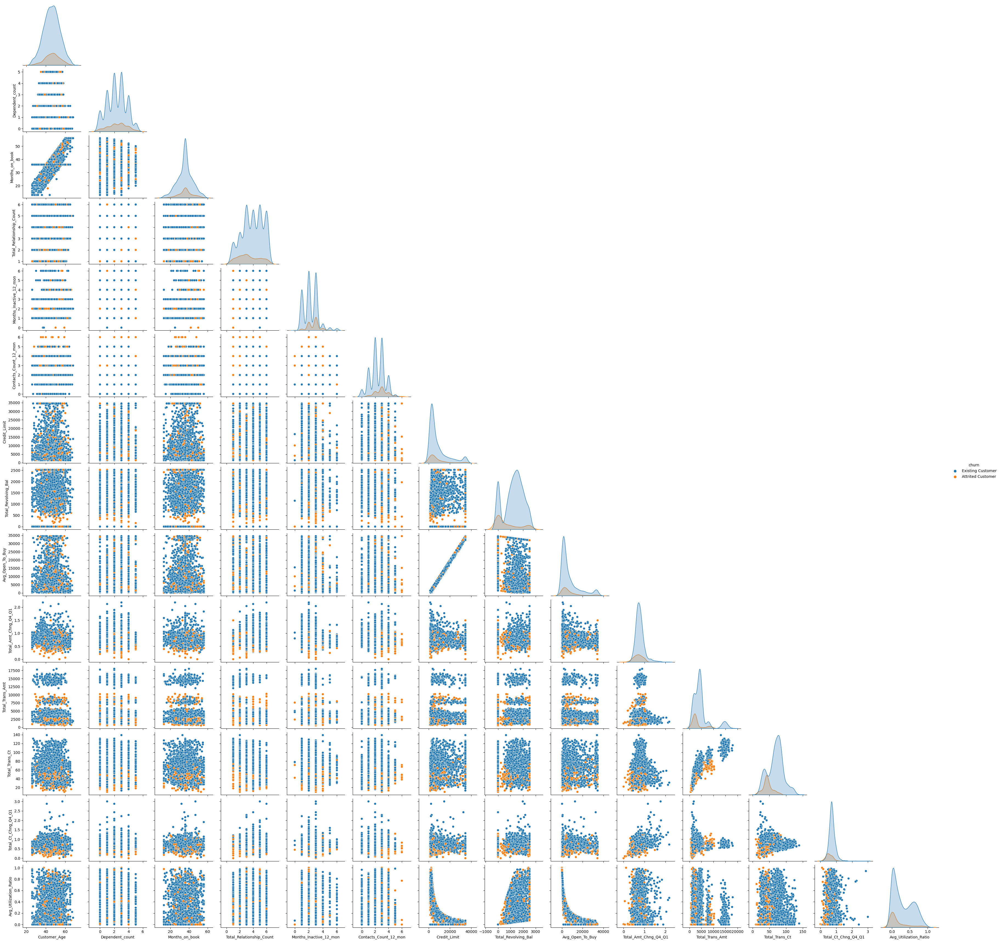

In [26]:
percent = 0.25
pairplot_n = ceil(df.shape[0] * percent)
pairplot_sample = df.sample(n=pairplot_n, random_state=0)
sb.pairplot(pairplot_sample, hue='churn', corner=True)
plt.show()

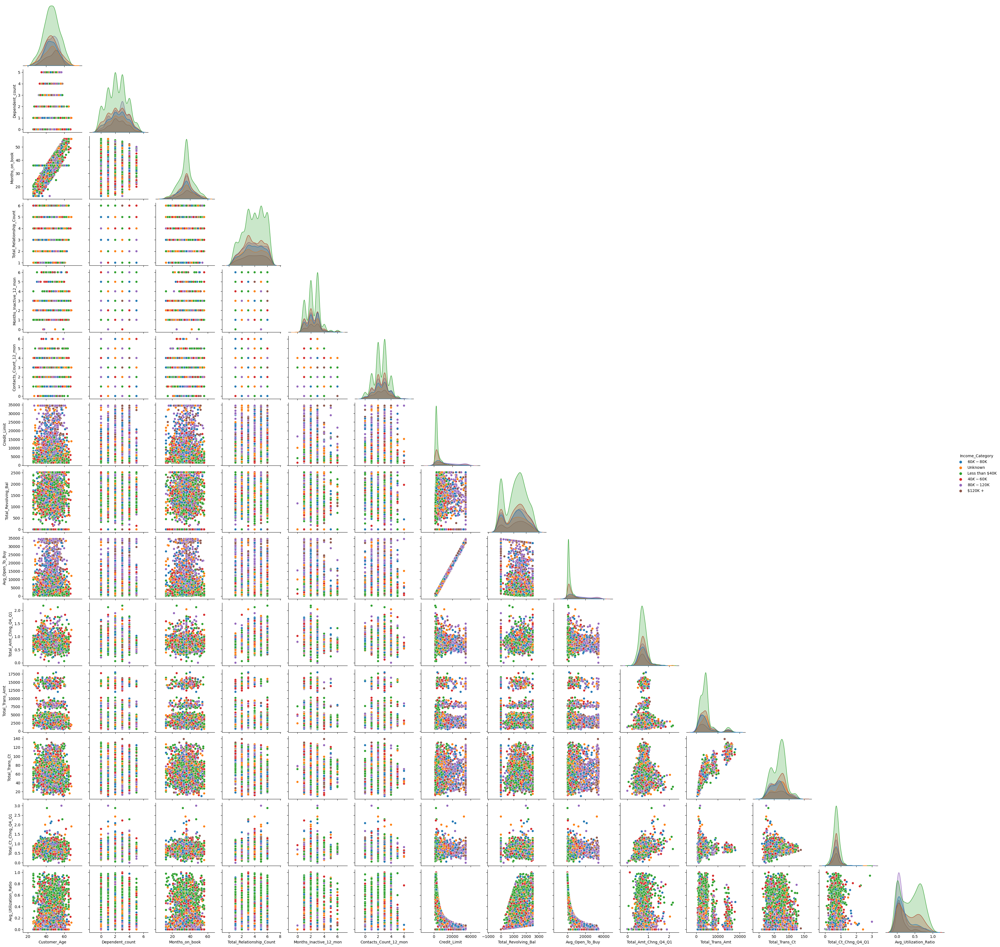

In [27]:
sb.pairplot(pairplot_sample, hue='Income_Category', corner=True)
plt.show()

### Корреляция признаков

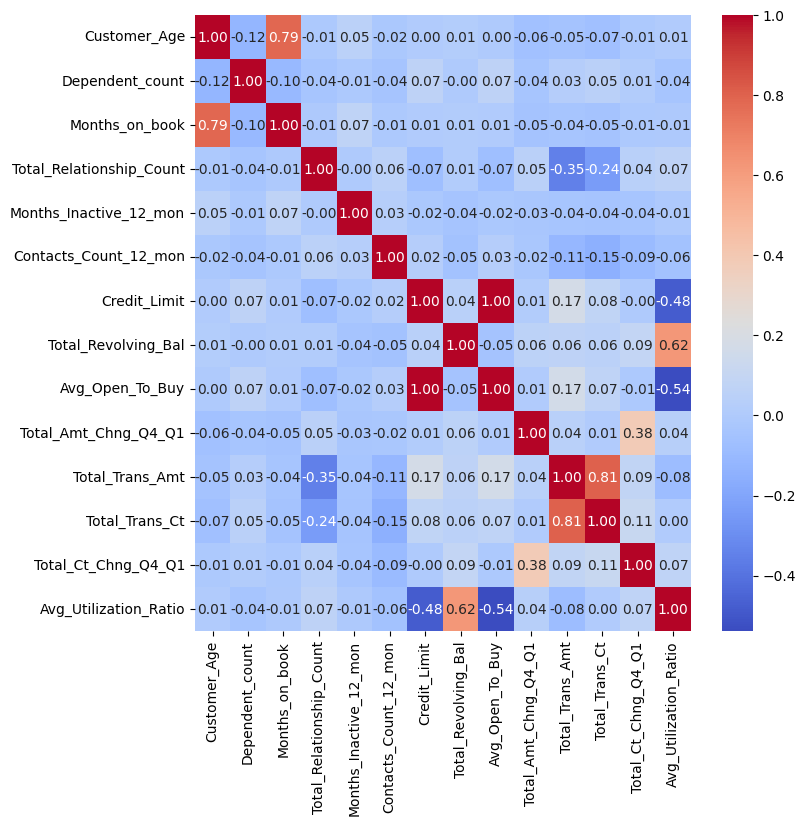

In [28]:
plt.figure(figsize=(8, 8))
sb.heatmap(df[get_numerical_cols(df)].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

## Clean dataset

In [29]:
df_cl = df.copy()

In [30]:
def print_unique(df: pd.DataFrame):
    obj_cols = get_obj_cols(df_cl)
    for c in obj_cols:
        print(f"Unique values of {c}: {df_cl[c].unique()}")    
        
print_unique(df_cl)

Unique values of churn: ['Existing Customer' 'Attrited Customer']
Unique values of Gender: ['M' 'F']
Unique values of Education_Level: ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Unique values of Marital_Status: ['Married' 'Single' 'Unknown' 'Divorced']
Unique values of Income_Category: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Unique values of Card_Category: ['Blue' 'Gold' 'Silver' 'Platinum']


In [31]:
# удалим неизвестные категории доходов
df_cl = df_cl[df_cl['Income_Category'] != 'Unknown']

# удалим неизвестный семейный статус
df_cl = df_cl[df_cl['Marital_Status'] != 'Unknown']

# удалим неизвестный уровень образования
df_cl = df_cl[df_cl['Education_Level'] != 'Unknown']

# удалим владельцев Platinum карт
df_cl = df_cl[df_cl['Card_Category'] != 'Platinum']

print_unique(df_cl)

Unique values of churn: ['Existing Customer' 'Attrited Customer']
Unique values of Gender: ['M' 'F']
Unique values of Education_Level: ['High School' 'Graduate' 'Uneducated' 'College' 'Post-Graduate'
 'Doctorate']
Unique values of Marital_Status: ['Married' 'Single' 'Divorced']
Unique values of Income_Category: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +']
Unique values of Card_Category: ['Blue' 'Gold' 'Silver']


In [32]:
# простые полиномиальные признаки
df_cl['Average_Trans_Ct'] = df_cl['Total_Trans_Amt'] / df_cl['Total_Trans_Ct']
df_cl['Average_Amt_Chng_Q4_Q1'] = df_cl['Total_Amt_Chng_Q4_Q1'] / df_cl['Total_Ct_Chng_Q4_Q1']
df_cl.replace([np.inf, -np.inf], 0, inplace=True)
df_cl.replace(np.nan, 0, inplace=True)

In [33]:
from numpy import mean
from numpy import std
from numpy import percentile

def m_outliers_std(data):    
    data_mean, data_std = mean(data), std(data)    
    cut_off = data_std * 3
    lower, upper = data_mean - cut_off, data_mean + cut_off    
    mask = (data > lower) & (data < upper) 
           
    print(f'Identified std outliers: {len(data) - len(data[mask])}')
    print(f'Non-outlier std observations: {len(data[mask])}' )        
    return mask

def m_outliers_iqr(data):  
    q25, q75 = percentile(data, 25), percentile(data, 75)
    iqr = q75 - q25    
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off    
    mask = (data > lower) & (data < upper) 
    
    print(f'Identified iqr outliers: {len(data) - len(data[mask])}')
    print(f'Non-outlier iqr observations: {len(data[mask])}' )   
    print(f'Percentiles: q25: {q25}, q75: {q75}, IQR {iqr}.')    
    return mask

_ = m_outliers_std(df_cl['Total_Trans_Amt'])
_ = m_outliers_iqr(df_cl['Total_Trans_Amt'])

Identified std outliers: 251
Non-outlier std observations: 6819
Identified iqr outliers: 618
Non-outlier iqr observations: 6452
Percentiles: q25: 2088.0, q75: 4738.0, IQR 2650.0.


In [34]:
df_cl = df_cl[m_outliers_iqr(df_cl['Total_Trans_Amt'])]
df_cl = df_cl[m_outliers_iqr(df_cl['Credit_Limit'])]

Identified iqr outliers: 618
Non-outlier iqr observations: 6452
Percentiles: q25: 2088.0, q75: 4738.0, IQR 2650.0.
Identified iqr outliers: 690
Non-outlier iqr observations: 5762
Percentiles: q25: 2405.0, q75: 9689.25, IQR 7284.25.


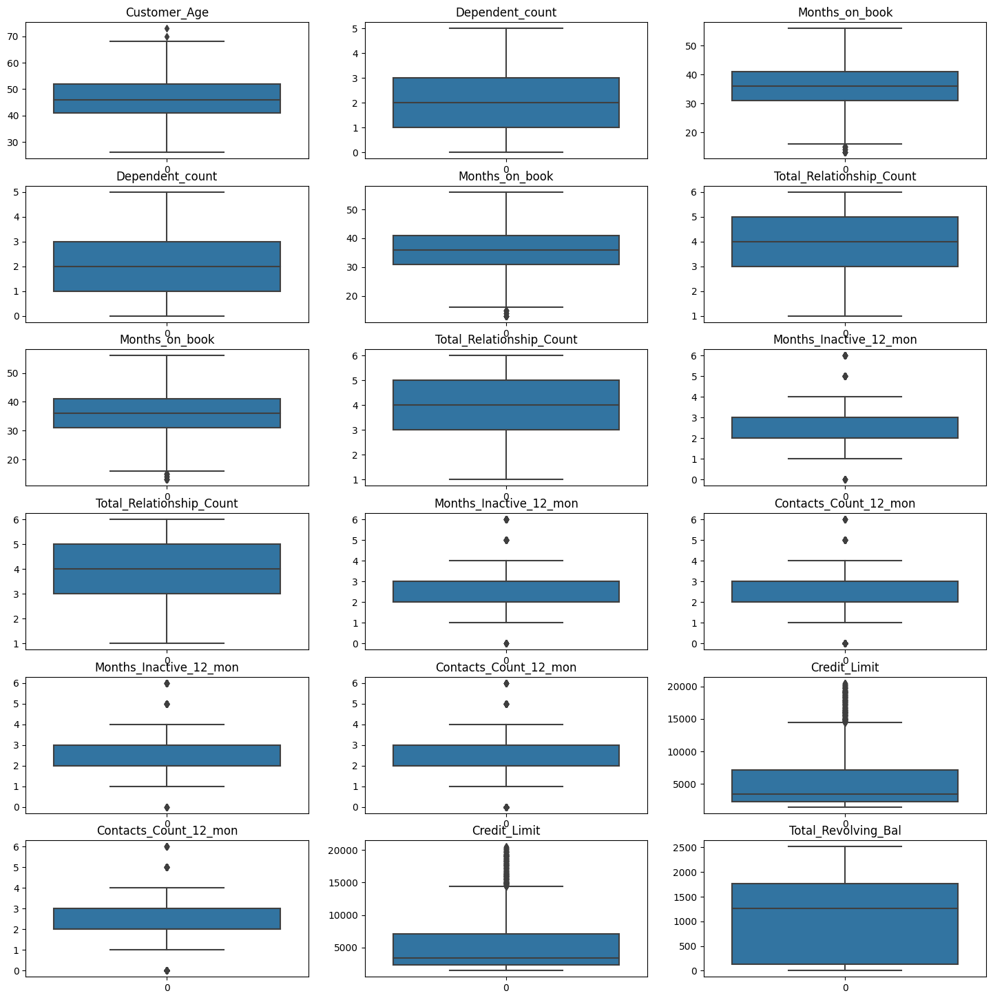

In [35]:
box_plot_all(df_cl)

In [36]:
df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5762 entries, 0 to 10067
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   churn                     5762 non-null   object 
 1   Customer_Age              5762 non-null   int64  
 2   Gender                    5762 non-null   object 
 3   Dependent_count           5762 non-null   int64  
 4   Education_Level           5762 non-null   object 
 5   Marital_Status            5762 non-null   object 
 6   Income_Category           5762 non-null   object 
 7   Card_Category             5762 non-null   object 
 8   Months_on_book            5762 non-null   int64  
 9   Total_Relationship_Count  5762 non-null   int64  
 10  Months_Inactive_12_mon    5762 non-null   int64  
 11  Contacts_Count_12_mon     5762 non-null   int64  
 12  Credit_Limit              5762 non-null   float64
 13  Total_Revolving_Bal       5762 non-null   int64  
 14  Avg_Open_To_

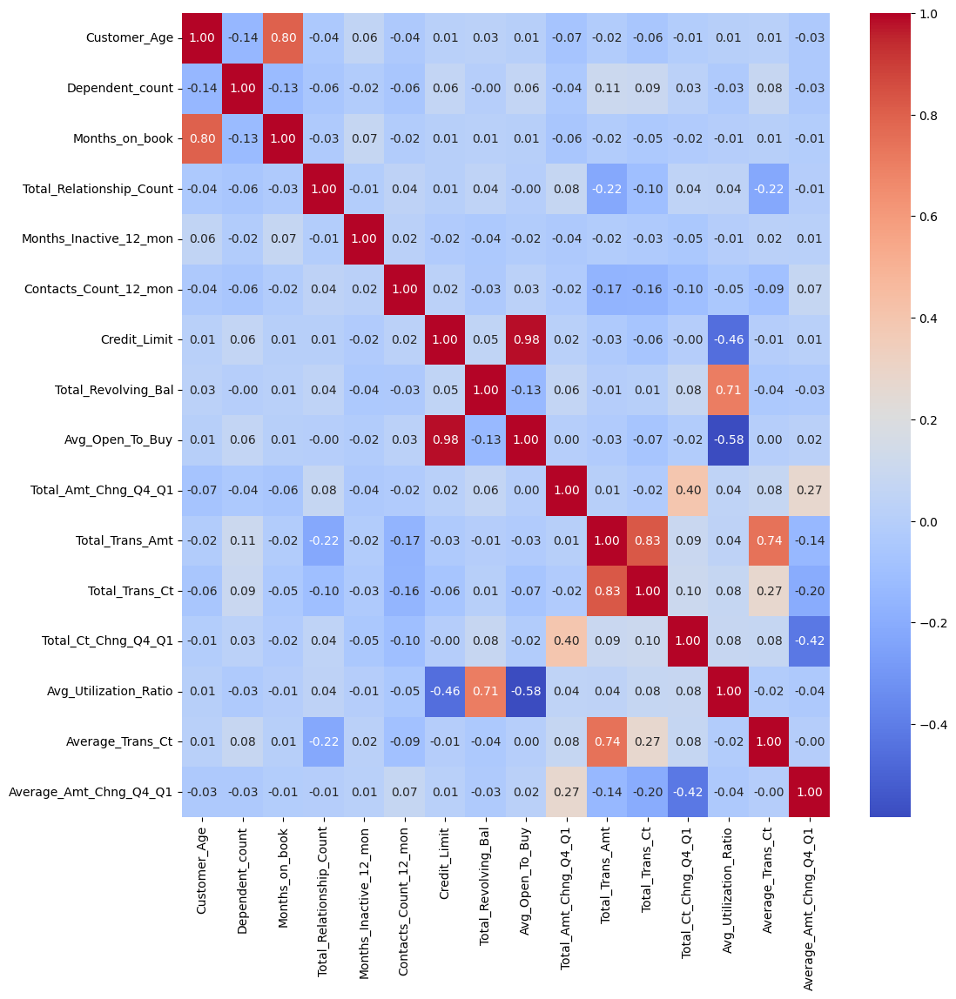

In [37]:
plt.figure(figsize=(12, 12))
sb.heatmap(df_cl[get_numerical_cols(df_cl)].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [38]:
df_cl.columns

Index(['churn', 'Customer_Age', 'Gender', 'Dependent_count', 'Education_Level',
       'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Average_Trans_Ct', 'Average_Amt_Chng_Q4_Q1'],
      dtype='object')

In [39]:
cols_to_drop = ['Avg_Open_To_Buy', 'Dependent_count', 'Customer_Age', 'Total_Revolving_Bal', 'Average_Trans_Ct', 'Average_Amt_Chng_Q4_Q1']  # Credit_Limit
#cols_to_drop = ['Education_Level','Marital_Status','Card_Category'] # Income_Category
df_cl.drop(columns=cols_to_drop, inplace=True)

In [40]:
df_cl.columns

Index(['churn', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio'],
      dtype='object')

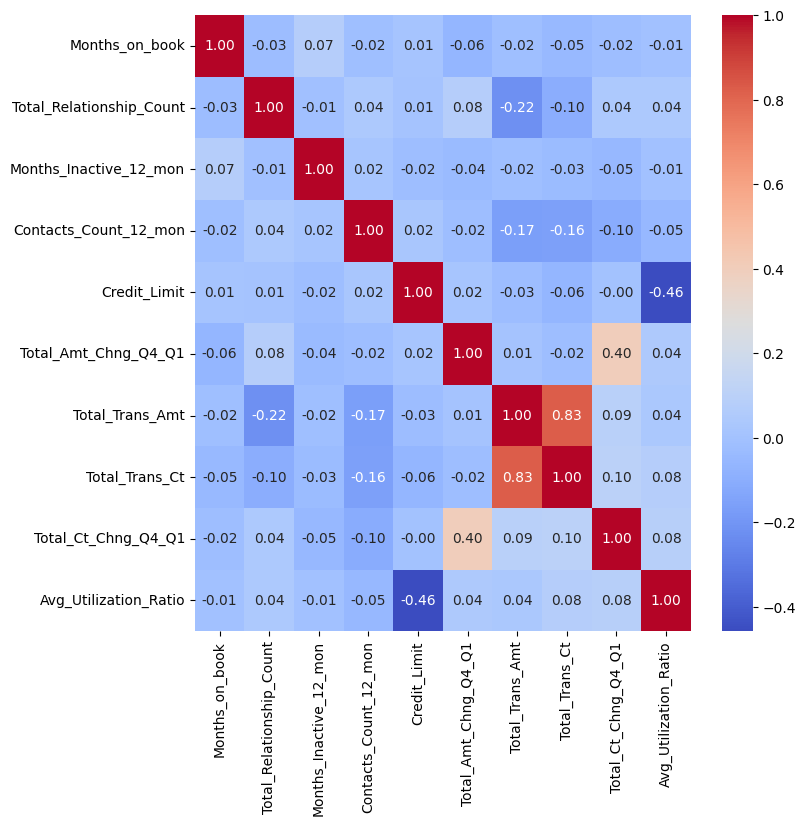

In [41]:
plt.figure(figsize=(8, 8))
sb.heatmap(df_cl[get_numerical_cols(df_cl)].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

## Encoding

In [42]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler, Normalizer, LabelBinarizer, LabelEncoder, Normalizer, RobustScaler, QuantileTransformer, minmax_scale, OrdinalEncoder

In [43]:
df_enc = df_cl.copy()

LabelEncoder example

In [44]:
le = LabelEncoder() # Энкодинг целевых (y) меток => (0, n_classes-1)
le.fit(["a", "b", "a", "c"])
print(le.classes_)
print(le.transform(["b", "a", "c"]))
print(le.inverse_transform([0, 0, 1, 2]))

['a' 'b' 'c']
[1 0 2]
['a' 'a' 'b' 'c']


LabelBinarizer example

In [45]:
lb = LabelBinarizer() # если очень хочется использовать модели бинарной классификации (0, 1) для предсказания многоклассовой классификации (0, n_classes - 1)
lb.fit([1, 2, 6, 4, 2])
print(lb.classes_)
print(lb.transform([1, 6]))

[1 2 4 6]
[[1 0 0 0]
 [0 0 0 1]]


OrdinalEncoder example

In [46]:
test_enc = df_cl.copy()

mX = [
    ['Less than $40K'],
    ['$40K - $60K'],
    ['$60K - $80K'],
    ['$80K - $120K'],
    ['$120K +']]

enc = OrdinalEncoder()

enc.fit(mX)
print(enc.categories_)
print(test_enc['Income_Category'].head(3))
# порядок и значения задается произвольно, для энкодинга 1 категориального порядкового признака не очень подходит
test_enc['Income_Category'] = enc.transform(test_enc[['Income_Category']]) 
print(test_enc['Income_Category'].head(3))

[array(['$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K',
       'Less than $40K'], dtype=object)]
0       $60K - $80K
1    Less than $40K
2      $80K - $120K
Name: Income_Category, dtype: object
0    2.0
1    4.0
2    3.0
Name: Income_Category, dtype: float64


/home/raiden/.local/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but OrdinalEncoder was fitted without feature names
  warnings.warn(


In [47]:
#% pip install category_encoders

In [48]:
from category_encoders import OrdinalEncoder # немного другой OE

maplist = [{'col': 'Income_Category', 'mapping': {'Less than $40K': 30.0, '$40K - $60K': 50.0,'$60K - $80K': 70.0, '$80K - $120K': 100.0, 'Very $120K +': 120.0}}]
oe = OrdinalEncoder(mapping=maplist)
df_enc = oe.fit_transform(df_enc)
print(df_enc['Income_Category'].head(3))

0     70.0
1     30.0
2    100.0
Name: Income_Category, dtype: float64


In [49]:
# Энкодинг двух классов
lb = LabelEncoder()
df_enc['churn'] = lb.fit_transform(df_enc['churn'])    
print(df_enc['churn'].head(3))

0    1
1    1
2    1
Name: churn, dtype: int64


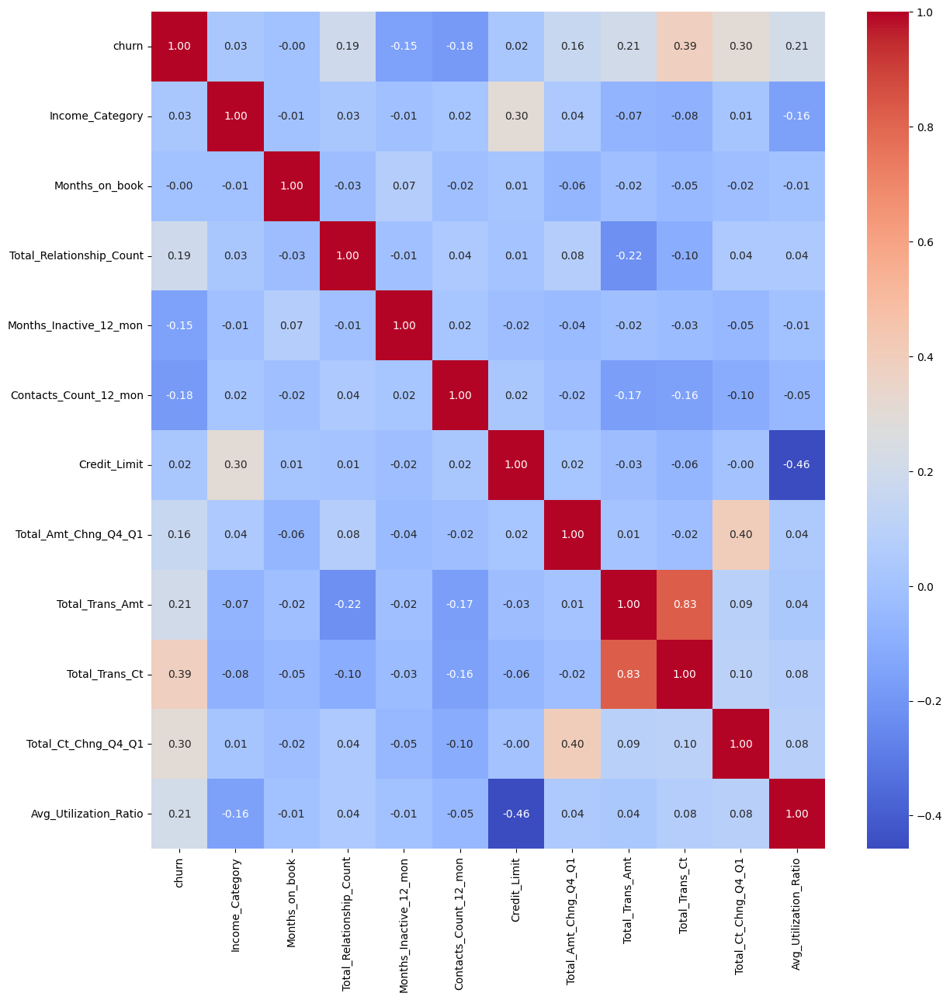

In [50]:
plt.figure(figsize=(14, 14))
sb.heatmap(df_enc[get_numerical_cols(df_enc)].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [51]:
obj_cols = get_obj_cols(df_enc)

# OHE на другие признаки
ohe_cols = []
for c in obj_cols:
    ohe = OneHotEncoder()
    t = ohe.fit_transform(df_enc[[c]])    
    df_enc[ohe.categories_[0]] = t.toarray()
    ohe_cols += list(ohe.categories_[0])

# Удалим obj_cols после энкодинга    
df_enc.drop(columns=obj_cols, inplace=True)
df_enc

,churn,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,F,M,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,Divorced,Married,Single,Blue,Gold,Silver
0,1,70.0,39,5,1,3,12691.0,1.335,1144,42,1.625,0.061,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,1,30.0,44,6,1,2,8256.0,1.541,1291,33,3.714,0.105,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,1,100.0,36,4,1,0,3418.0,2.594,1887,20,2.333,0.000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,1,70.0,21,5,1,0,4716.0,2.175,816,28,2.500,0.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
5,1,50.0,36,3,1,2,4010.0,1.376,1088,24,0.846,0.311,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10022,0,70.0,34,1,2,4,4930.0,0.592,7412,60,0.579,0.032,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
10048,0,100.0,44,2,3,3,9524.0,0.559,7527,58,0.657,0.152,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
10052,0,50.0,24,4,2,4,4169.0,0.836,8565,70,0.795,0.128,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
10054,0,30.0,15,1,1,3,3709.0,0.645,8130,74,0.897,0.318,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [52]:
feature_cols = ohe_cols + ['churn', 'Income_Category']
feature_cols # столбцы с закодированными признаками

['F',
 'M',
 'College',
 'Doctorate',
 'Graduate',
 'High School',
 'Post-Graduate',
 'Uneducated',
 'Divorced',
 'Married',
 'Single',
 'Blue',
 'Gold',
 'Silver',
 'churn',
 'Income_Category']

In [53]:
transform_cols =  list(set(df_enc.columns.tolist()) - set(feature_cols))
transform_cols # столбцы с числовыми признаками

['Total_Trans_Ct',
 'Total_Trans_Amt',
 'Total_Amt_Chng_Q4_Q1',
 'Credit_Limit',
 'Contacts_Count_12_mon',
 'Avg_Utilization_Ratio',
 'Total_Relationship_Count',
 'Months_on_book',
 'Months_Inactive_12_mon',
 'Total_Ct_Chng_Q4_Q1']

Преобразует данные к равномерному или нормальному распределению с помощью информации о квантилях.

In [54]:
qt = QuantileTransformer(output_distribution='uniform')      
df_enc[transform_cols] = qt.fit_transform(df_enc[transform_cols])      

In [55]:
df_enc[feature_cols+transform_cols] = minmax_scale(df_enc[feature_cols+transform_cols])

In [56]:
df_enc

,churn,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,F,M,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,Divorced,Married,Single,Blue,Gold,Silver
0,1.0,0.702970,0.696697,0.702703,0.109109,0.669169,0.904662,0.975394,0.031939,0.240240,0.993994,0.267768,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,1.0,0.306931,0.837838,1.000000,0.109109,0.341842,0.793547,0.988524,0.061061,0.108609,1.000000,0.321822,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,1.0,1.000000,0.498498,0.497497,0.109109,0.000000,0.506010,0.999285,0.219895,0.013514,0.998051,0.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,1.0,0.702970,0.042042,0.702703,0.109109,0.000000,0.621603,0.998617,0.008877,0.056557,0.998406,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
5,1.0,0.504950,0.498498,0.278779,0.109109,0.341842,0.563719,0.979022,0.025278,0.027027,0.784284,0.546803,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10022,0.0,0.702970,0.330330,0.000000,0.378879,0.907407,0.634387,0.196196,0.959493,0.442442,0.262262,0.251938,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
10048,0.0,1.000000,0.837838,0.114114,0.735235,0.669169,0.835368,0.142142,0.962933,0.418919,0.420921,0.383383,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
10052,0.0,0.504950,0.077077,0.497497,0.378879,0.907407,0.577791,0.713714,0.996679,0.607107,0.703203,0.351351,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
10054,0.0,0.306931,0.009009,0.000000,0.109109,0.669169,0.539369,0.296797,0.984844,0.685686,0.848348,0.552553,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


## Datasets

In [57]:
from sklearn.model_selection import train_test_split
from collections import Counter

### Original

In [58]:
prediction_label_churn = 'churn'
prediction_label_income = 'Income_Category'

Y = df_enc[prediction_label_churn]
X = df_enc.drop(columns=[prediction_label_churn]) 

Y_income = df_enc[prediction_label_income]
X_income = df_enc.drop(columns=[prediction_label_income]) 

In [59]:
print('Original dataset shape %s' % Counter(Y))

Original dataset shape Counter({1.0: 4820, 0.0: 942})


### Undersampling

In [60]:
# балансировка классов через уменьшение перепредставленного класса
msk_negative = df_enc[prediction_label_churn] == 1
msk_positive = df_enc[prediction_label_churn] == 0

df_negative_undersample = df_enc[msk_negative].sample(n=msk_positive.sum(), random_state=42)
df_undersample = pd.concat([df_negative_undersample, df_enc[msk_positive]])

uY = df_undersample[prediction_label_churn]
uX = df_undersample.drop(columns=[prediction_label_churn]) 

In [61]:
print('Undersampled dataset shape %s' % Counter(uY))

Undersampled dataset shape Counter({1.0: 942, 0.0: 942})


### Oversampling

In [62]:
from imblearn.over_sampling import ADASYN

In [63]:
ada = ADASYN(random_state=42, n_jobs=-1)
X_res, y_res = ada.fit_resample(X, Y)

Y_income_res = X_res[prediction_label_income]
X_income_res = X_res.drop(columns=[prediction_label_income]) 

/home/raiden/.local/lib/python3.11/site-packages/imblearn/over_sampling/_adasyn.py:156: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


In [64]:
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({0.0: 4893, 1.0: 4820})


### Upsampling

In [65]:
from imblearn.over_sampling import SMOTE

In [66]:
oversample = SMOTE(random_state=42, n_jobs=-1)
X_ov, y_ov = oversample.fit_resample(X, Y)

/home/raiden/.local/lib/python3.11/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


In [67]:
print('Upsampled dataset shape %s' % Counter(y_ov))

Upsampled dataset shape Counter({1.0: 4820, 0.0: 4820})


### TomekLinks

In [68]:
from imblearn.under_sampling import TomekLinks

In [69]:
tom = TomekLinks()
X_tom, y_tom = tom.fit_resample(X, Y)

In [70]:
print('TomekLinks dataset shape %s' % Counter(y_tom))

TomekLinks dataset shape Counter({1.0: 4653, 0.0: 942})


In [71]:
def split(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42, shuffle=True)
    return X_train, X_test, y_train, y_test

In [72]:
dataset_pairs_churn = ((X, Y, "Original"), (uX, uY, "Undersampled"), (X_res, y_res, "Oversampled"), (X_ov, y_ov, "Upsampled"), (X_tom, y_tom, "TomekLinks"))

#prediction_label_income = 'Income_Category'
#dataset_pairs_income = ((X, Y, "Original"), (uX, uY, "Undersampled"), (X_res, y_res, "Oversampled"), (X_ov, y_ov, "Upsampled"), (X_tom, y_tom, "TomekLinks"))

## Models

In [73]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from numpy import absolute
from sklearn.metrics import r2_score
from numpy import arange
from sklearn.model_selection import GridSearchCV

In [74]:
def model_cross_val_score(model, dataset_pairs, scorings, silent=False):    
    """
    Perform cross-validation and calculate scores for a model on multiple datasets.

    Args:
        model: The machine learning model.
        dataset_pairs (list): A list of tuples containing the feature matrix, target variable and dataset name for each dataset.
        scorings (list): A list of scoring metrics for evaluation.
        silent (bool, optional): Whether to suppress printing of score results. Defaults to False.

    Returns:
        None

    """    
    for pair in dataset_pairs:    
        if not silent:
            print(f"\n==> Result on {pair[2]} dataset:")
        for scoring in scorings:            
            cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)
            scores = cross_val_score(model, pair[0], pair[1], scoring=scoring, cv=cv, n_jobs=-1)
            scores = absolute(scores)
            if not silent:                    
                print(f"{scoring}: mean {mean(scores):1.4f} std {std(scores):1.4f}")                          

In [75]:
def grid_search(model_class, X, y, scoring, grid, silent=False):
    """
    Perform grid search for hyperparameter tuning of a model.

    Args:
        model_class (class): The machine learning model class.
        X (array-like): The feature matrix.
        y (array-like): The target variable.
        scoring (str): The scoring metric for evaluation.
        grid (dict): The parameter grid for grid search.
        silent (bool, optional): Whether to suppress printing of search results. Defaults to False.

    Returns:
        dict: The best parameter configuration found during grid search.

    """    
    first_values_dict = {k: v[0] for k, v in grid.items()}
    model = model_class(**first_values_dict)    
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)        
    search = GridSearchCV(model, grid, scoring=scoring, cv=cv, n_jobs=-1)
    results = search.fit(X, y)
    if not silent:
        print(f"Best {scoring} score: {results.best_score_:1.4f}")
        print(f"Config: {results.best_params_}")
    return results.best_params_

In [76]:
from itertools import chain, combinations

def powerset(iterable):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)  # allows duplicate elements
    return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

def grid_search_w_drops(model_class, X, y, grid, scoring, cols_to_drop=X.columns):    
    """Grid Search с дропом по всем возможным комбинациям столбцов"""
    best_score = -1
    best_conf = {}    
    best_drop = []
    
    for i, combo in enumerate(powerset(cols_to_drop), 1):    
        
        if i % 50 == 0:
            print('Testing combo #{}: {}'.format(i, list(combo)))            
            
        _X = X.drop(columns=list(combo))
        model = model_class()    
        cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)                     
        search = GridSearchCV(model, grid, scoring=scoring, cv=cv, n_jobs=-1)
        results = search.fit(_X, y)
        
        if best_score < results.best_score_: # не для всех оценок больше это лучше
            best_score = results.best_score_
            best_conf = results.best_params_
            best_drop = list(combo) 
                                   
    print(f"Best {scoring} score: {best_score:1.4f}")
    print(f"Config: {results.best_params_}")
    print(f"Best drop: {best_drop}")            
    
    return best_conf

In [77]:
def grid_search_w_cross_val(model, dataset_pairs, validate_scorings, grid_scoring, grid, val_on_same_dataset = False):
    """
    Perform grid search with cross-validation for hyperparameter tuning of a model.

    Args:
        model (class): The machine learning model class.
        dataset_pairs (list): A list of tuples containing the feature matrix, target variable and dataset name for each dataset.
        validate_scorings (list): A list of scoring metrics for validation.
        grid_scoring (str): The scoring metric used for grid search.
        grid (dict): The parameter grid for grid search.
        val_on_same_dataset (bool, optional): Whether to perform validation on the same dataset used for grid search. 
                                             Defaults to False.

    Returns:
        None

    """    
    print(f"Searching parameters for {model.__name__} model.")
    
    for pair in dataset_pairs:            
        
        print(f"{'=' * 50}\nGrid Search result on {pair[2]} dataset: ")
        params = grid_search(model, pair[0], pair[1], scoring=grid_scoring, grid=grid)
        
        print(f"\nValidation result: ")        
        val_pairs = [pair] if val_on_same_dataset else dataset_pairs            
        model_cross_val_score(model(**params), val_pairs, scorings=validate_scorings)

In [78]:
import sklearn
sklearn.metrics.get_scorer_names() 

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'matthews_corrcoef',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_negative_likelihood_ratio',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'positive_likelihood_ratio',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',

### LogisticRegression

$y = f(β0 + β1x1 + β2x2+… βnxn)$

$f(x)=\dfrac{1}{1+e^{−x}}$ — сигмоидная функция.

In [79]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score, fbeta_score, roc_auc_score, confusion_matrix, accuracy_score

In [80]:
lr_grid = dict()
lr_grid['max_iter'] = np.arange(150, 350, 50)
lr_grid['solver'] = ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
lr_scorings = ['f1', 'accuracy', 'r2']
lr_scoring = 'f1'

In [81]:
grid_search_w_cross_val(LogisticRegression, dataset_pairs_churn, lr_scorings, lr_scoring, lr_grid)

Searching parameters for LogisticRegression model.
Grid Search result on Original dataset: 
Best f1 score: 0.9462
Config: {'max_iter': 150, 'solver': 'liblinear'}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9462 std 0.0045
accuracy: mean 0.9077 std 0.0077
r2: mean 0.3230 std 0.0659

==> Result on Undersampled dataset:
f1: mean 0.8457 std 0.0124
accuracy: mean 0.8452 std 0.0121
r2: mean 0.3799 std 0.0485

==> Result on Oversampled dataset:
f1: mean 0.8477 std 0.0072
accuracy: mean 0.8509 std 0.0066
r2: mean 0.4030 std 0.0265

==> Result on Upsampled dataset:
f1: mean 0.8695 std 0.0051
accuracy: mean 0.8706 std 0.0043
r2: mean 0.4820 std 0.0172

==> Result on TomekLinks dataset:
f1: mean 0.9467 std 0.0049
accuracy: mean 0.9091 std 0.0081
r2: mean 0.3487 std 0.0638
Grid Search result on Undersampled dataset: 
Best f1 score: 0.8469
Config: {'max_iter': 150, 'solver': 'saga'}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9461 std 0.0045
accuracy: mean

In [82]:
for pair in dataset_pairs_churn:
    X_train, X_test, y_train, y_test = split(pair[0], pair[1])
    lr_model = LogisticRegression(**grid_search(LogisticRegression, X_train, y_train, lr_scoring, lr_grid))
    lr_model.fit(X_train, y_train)
    y_pred = lr_model.predict(X_test)
    y_pred_train = lr_model.predict(X_train)        
    
    if False: # print train or not
        print(f"{'='*10} {pair[2]} Train {'='*10}")
        print(f"Accuracy {accuracy_score(y_train, y_pred_train)} F1: {f1_score(y_train, y_pred_train)}")
        print("Confusion Matrix \n", confusion_matrix(y_train, y_pred_train))
        print("Classification Report \n", classification_report(y_train, y_pred_train))    
            
    print(f"{'=' * 50}\nResult on {pair[2]} dataset: ")
    print(f"Accuracy {accuracy_score(y_test, y_pred)} F1: {f1_score(y_test, y_pred)}")
    print("\nConfusion Matrix \n", confusion_matrix(y_test, y_pred))    
    print("\nClassification Report \n", classification_report(y_test, y_pred))    

Best f1 score: 0.9453
Config: {'max_iter': 150, 'solver': 'saga'}
Result on Original dataset: 
Accuracy 0.9124024284475282 F1: 0.9490670700958144

Confusion Matrix 
 [[111  80]
 [ 21 941]]

Classification Report 
               precision    recall  f1-score   support

         0.0       0.84      0.58      0.69       191
         1.0       0.92      0.98      0.95       962

    accuracy                           0.91      1153
   macro avg       0.88      0.78      0.82      1153
weighted avg       0.91      0.91      0.91      1153

Best f1 score: 0.8489
Config: {'max_iter': 150, 'solver': 'liblinear'}
Result on Undersampled dataset: 
Accuracy 0.8488063660477454 F1: 0.8455284552845529

Confusion Matrix 
 [[164  25]
 [ 32 156]]

Classification Report 
               precision    recall  f1-score   support

         0.0       0.84      0.87      0.85       189
         1.0       0.86      0.83      0.85       188

    accuracy                           0.85       377
   macro avg      

### Regularization

### L1
$ L_{reg} = L(b) +\lambda \sum \limits_{j=1}^{n}|b_j|. $


In [83]:
from sklearn.linear_model import Lasso

In [84]:
start = 0.001
step = 0.05
stop = 1
stop = stop + step

reg_grid = dict()
reg_grid['alpha'] = np.arange(0, stop, step)
reg_grid['alpha'][0] = start
reg_scorings = ['neg_mean_absolute_error', 'r2']
reg_scoring = 'r2'

In [85]:
grid_search_w_drops(Lasso, X, Y, reg_grid, reg_scoring, cols_to_drop=[]) #['Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']) # 'Total_Trans_Amt', 'Total_Trans_Ct'

Best r2 score: 0.3640
Config: {'alpha': 0.001}
Best drop: []


{'alpha': 0.001}

In [86]:
grid_search_w_cross_val(Lasso, dataset_pairs_churn, reg_scorings, reg_scoring, reg_grid)

Searching parameters for Lasso model.
Grid Search result on Original dataset: 
Best r2 score: 0.3640
Config: {'alpha': 0.001}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2240 std 0.0045
r2: mean 0.3640 std 0.0254

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2844 std 0.0072
r2: mean 0.5150 std 0.0266

==> Result on Oversampled dataset:
neg_mean_absolute_error: mean 0.2858 std 0.0046
r2: mean 0.5175 std 0.0129

==> Result on Upsampled dataset:
neg_mean_absolute_error: mean 0.2669 std 0.0038
r2: mean 0.5637 std 0.0083

==> Result on TomekLinks dataset:
neg_mean_absolute_error: mean 0.2247 std 0.0041
r2: mean 0.3848 std 0.0235
Grid Search result on Undersampled dataset: 
Best r2 score: 0.5150
Config: {'alpha': 0.001}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2240 std 0.0045
r2: mean 0.3640 std 0.0254

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2844 std 0.00

### L2
$ L_{reg}  = L(b)+\lambda \sum \limits_{j=1}^{n} b_j^2 $

In [87]:
from sklearn.linear_model import Ridge

In [88]:
grid_search_w_cross_val(Ridge, dataset_pairs_churn, reg_scorings, reg_scoring, reg_grid)

Searching parameters for Ridge model.
Grid Search result on Original dataset: 
Best r2 score: 0.3645
Config: {'alpha': 1.0}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2255 std 0.0046
r2: mean 0.3645 std 0.0267

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2842 std 0.0072
r2: mean 0.5143 std 0.0262

==> Result on Oversampled dataset:
neg_mean_absolute_error: mean 0.2844 std 0.0047
r2: mean 0.5184 std 0.0133

==> Result on Upsampled dataset:
neg_mean_absolute_error: mean 0.2659 std 0.0035
r2: mean 0.5648 std 0.0077

==> Result on TomekLinks dataset:
neg_mean_absolute_error: mean 0.2259 std 0.0040
r2: mean 0.3856 std 0.0253
Grid Search result on Undersampled dataset: 
Best r2 score: 0.5144
Config: {'alpha': 0.30000000000000004}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2256 std 0.0046
r2: mean 0.3645 std 0.0267

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2

### ElasticNet
$ L_{reg}= L(b) +\lambda_1 \sum \limits_{i}^{n} |b|  + \lambda_2 \sum \limits_{j}^{n}b_j^2. $

In [89]:
from sklearn.linear_model import ElasticNet

In [90]:
grid_search_w_cross_val(ElasticNet, dataset_pairs_churn, reg_scorings, reg_scoring, reg_grid)

Searching parameters for ElasticNet model.
Grid Search result on Original dataset: 
Best r2 score: 0.3647
Config: {'alpha': 0.001}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2244 std 0.0045
r2: mean 0.3647 std 0.0258

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2843 std 0.0072
r2: mean 0.5149 std 0.0263

==> Result on Oversampled dataset:
neg_mean_absolute_error: mean 0.2855 std 0.0046
r2: mean 0.5178 std 0.0131

==> Result on Upsampled dataset:
neg_mean_absolute_error: mean 0.2666 std 0.0037
r2: mean 0.5642 std 0.0081

==> Result on TomekLinks dataset:
neg_mean_absolute_error: mean 0.2249 std 0.0041
r2: mean 0.3856 std 0.0241
Grid Search result on Undersampled dataset: 
Best r2 score: 0.5149
Config: {'alpha': 0.001}

Validation result: 

==> Result on Original dataset:
neg_mean_absolute_error: mean 0.2244 std 0.0045
r2: mean 0.3647 std 0.0258

==> Result on Undersampled dataset:
neg_mean_absolute_error: mean 0.2843 std

### KNN

![image.png](1.webp)

In [91]:
from sklearn.neighbors import KNeighborsClassifier

In [114]:
knn_grid = dict()
knn_grid['n_neighbors'] = arange(1, 20, 3)
knn_grid['metric'] = ['cityblock', 'euclidean', 'manhattan', 'minkowski']
knn_scorings = ['f1', 'accuracy', 'r2']
knn_scoring = 'f1'

In [93]:
grid_search_w_cross_val(KNeighborsClassifier, dataset_pairs_churn, knn_scorings, knn_scoring, knn_grid)

Searching parameters for KNeighborsClassifier model.
Grid Search result on Original dataset: 
Best f1 score: 0.9393
Config: {'metric': 'cityblock', 'n_neighbors': 9}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9393 std 0.0046
accuracy: mean 0.8938 std 0.0075
r2: mean 0.2227 std 0.0431

==> Result on Undersampled dataset:
f1: mean 0.8086 std 0.0221
accuracy: mean 0.8155 std 0.0180
r2: mean 0.2608 std 0.0719

==> Result on Oversampled dataset:
f1: mean 0.8731 std 0.0087
accuracy: mean 0.8874 std 0.0075
r2: mean 0.5494 std 0.0298

==> Result on Upsampled dataset:
f1: mean 0.8912 std 0.0080
accuracy: mean 0.8993 std 0.0071
r2: mean 0.5970 std 0.0282

==> Result on TomekLinks dataset:
f1: mean 0.9417 std 0.0037
accuracy: mean 0.8987 std 0.0062
r2: mean 0.2751 std 0.0447
Grid Search result on Undersampled dataset: 
Best f1 score: 0.8206
Config: {'metric': 'cityblock', 'n_neighbors': 49}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9268 std 0.0052
accu

### SVM

![image.png](2.webp)

In [94]:
from sklearn.svm import SVC

In [95]:
svc_grid = dict()
svc_grid['C'] = arange(2, 6, 0.5)
svc_grid['kernel'] = ['linear'] # 'rbf', 'sigmoid', 'precomputed'
svc_scorings = ['f1', 'accuracy', 'r2']
svc_scoring = 'f1'

In [96]:
grid_search_w_cross_val(SVC, dataset_pairs_churn, svc_scorings, svc_scoring, svc_grid)

Searching parameters for SVC model.
Grid Search result on Original dataset: 
Best f1 score: 0.9455
Config: {'C': 2.0, 'kernel': 'linear'}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9455 std 0.0046
accuracy: mean 0.9066 std 0.0078
r2: mean 0.3148 std 0.0679

==> Result on Undersampled dataset:
f1: mean 0.8547 std 0.0142
accuracy: mean 0.8533 std 0.0131
r2: mean 0.4125 std 0.0526

==> Result on Oversampled dataset:
f1: mean 0.8474 std 0.0077
accuracy: mean 0.8513 std 0.0071
r2: mean 0.4046 std 0.0286

==> Result on Upsampled dataset:
f1: mean 0.8694 std 0.0051
accuracy: mean 0.8705 std 0.0043
r2: mean 0.4819 std 0.0174

==> Result on TomekLinks dataset:
f1: mean 0.9464 std 0.0047
accuracy: mean 0.9088 std 0.0077
r2: mean 0.3467 std 0.0604
Grid Search result on Undersampled dataset: 
Best f1 score: 0.8548
Config: {'C': 2.5, 'kernel': 'linear'}

Validation result: 

==> Result on Original dataset:
f1: mean 0.9453 std 0.0046
accuracy: mean 0.9063 std 0.0079
r2: mean 0.

In [97]:
def leaderboard(models, grids, X, y, scorings):
    """
    Calculate and return a leaderboard of models based on cross-validation scores.

    Args:
        models (list): A list of machine learning models.
        grids (list): A list of parameter grids for grid search.
        X (array-like): The feature matrix.
        y (array-like): The target variable.
        scorings (list): A list of scoring metrics for evaluation.

    Returns:
        pd.DataFrame: A DataFrame containing the leaderboard scores.

    """    
    leaderboard_scores = pd.DataFrame(columns=['Model', 'Scoring', 'Score mean', 'Score std', 'Config'])
    for scroring in scorings:
        for model, grid in zip(models, grids):
            print(f"Testing {model.__name__} ...")
            params = grid_search(model, X, y, scroring, grid, silent=True)
            m = model(**params)
            cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)
            scores = cross_val_score(m, X, y, scoring=scroring, cv=cv, n_jobs=-1)
            scores = absolute(scores)                    
            score_mean = mean(scores)
            score_std = std(scores)
            leaderboard_scores = pd.concat([leaderboard_scores, pd.Series({k: v for k, v in zip(leaderboard_scores.columns, [model.__name__, scroring, score_mean, score_std, params])}).to_frame().T], ignore_index=True)
    leaderboard_scores = leaderboard_scores.sort_values(by=['Scoring', 'Score mean'], ascending=[True, False])
    leaderboard_scores.reset_index(inplace=True, drop=True)
    return leaderboard_scores            

In [98]:
models = [Lasso, Ridge, ElasticNet, KNeighborsClassifier, LogisticRegression, SVC]
grids = [reg_grid, reg_grid, reg_grid, knn_grid, lr_grid, svc_grid]
lscorings = ['r2']

leaderboard(models, grids, X_res, y_res, lscorings)

Testing Lasso ...
Testing Ridge ...
Testing ElasticNet ...
Testing KNeighborsClassifier ...
Testing LogisticRegression ...
Testing SVC ...


,Model,Scoring,Score mean,Score std,Config
0,KNeighborsClassifier,r2,0.772786,0.014016,"{'metric': 'cityblock', 'n_neighbors': 1}"
1,Ridge,r2,0.518368,0.013308,{'alpha': 0.4}
2,ElasticNet,r2,0.517822,0.013134,{'alpha': 0.001}
3,Lasso,r2,0.517481,0.012908,{'alpha': 0.001}
4,SVC,r2,0.404615,0.028614,"{'C': 2.0, 'kernel': 'linear'}"
5,LogisticRegression,r2,0.403379,0.026635,"{'max_iter': 150, 'solver': 'lbfgs'}"


## Bagging

In [99]:
from sklearn.ensemble import BaggingClassifier
from sklearn import tree

In [100]:
t_grid = dict()
t_grid['max_depth'] = arange(1, 8, 1)

b_grid = dict()
b_grid['n_estimators'] = arange(1, 15, 1)
b_grid['estimator'] = [tree.DecisionTreeClassifier(**grid_search(tree.DecisionTreeClassifier, X, Y, "f1", t_grid, silent=True))]

In [101]:
models = [BaggingClassifier, tree.DecisionTreeClassifier]
grids = [b_grid, t_grid]

leaderboard(models, grids, X, Y, ['f1', 'accuracy'])

Testing BaggingClassifier ...
Testing DecisionTreeClassifier ...
Testing BaggingClassifier ...
Testing DecisionTreeClassifier ...


,Model,Scoring,Score mean,Score std,Config
0,BaggingClassifier,accuracy,0.948918,0.006023,{'estimator': DecisionTreeClassifier(max_depth...
1,DecisionTreeClassifier,accuracy,0.933588,0.004982,{'max_depth': 7}
2,BaggingClassifier,f1,0.968659,0.003995,{'estimator': DecisionTreeClassifier(max_depth...
3,DecisionTreeClassifier,f1,0.960762,0.00243,{'max_depth': 7}


In [102]:
print("BaggingClassifier vs DecisionTreeClassifier")    
for pair in dataset_pairs_churn:            
    bagging_m = BaggingClassifier(tree.DecisionTreeClassifier( max_depth = 4 ),
                                n_estimators = 10,
                                n_jobs = -1,
                                )
    m_tree = tree.DecisionTreeClassifier(max_depth = 4)
    
    X_train, X_test, y_train, y_test = split(pair[0], pair[1])
    bagging_m.fit(X_train, y_train)
    m_tree.fit(X_train, y_train)
    
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)
    b_scores = absolute(cross_val_score(bagging_m, X_test, y_test, scoring='f1', cv=cv, n_jobs=-1))
    t_scores = absolute(cross_val_score(m_tree, X_test, y_test, scoring='f1', cv=cv, n_jobs=-1))
                         
    #print(f"{scoring}: mean {mean(scores):1.4f} std {std(scores):1.4f}") 
    
    print(f"{'=' * 15} Result on {pair[2]} dataset: {'=' * 15}")    
    print(f"Scores f1: Bagging: {mean(b_scores):1.4f} Decision Tree: {mean(t_scores):1.4f}")
    print("Train")
    print(classification_report( y_train, bagging_m.predict(X_train) ))
    print("\nTest")
    print(classification_report( y_test, bagging_m.predict(X_test) ))

BaggingClassifier vs DecisionTreeClassifier
=============== Result on Original dataset: ===============
Scores f1: Bagging: 0.9526 Decision Tree: 0.9382
Train
              precision    recall  f1-score   support

         0.0       0.81      0.80      0.80       751
         1.0       0.96      0.96      0.96      3858

    accuracy                           0.94      4609
   macro avg       0.88      0.88      0.88      4609
weighted avg       0.94      0.94      0.94      4609


Test
              precision    recall  f1-score   support

         0.0       0.78      0.73      0.76       191
         1.0       0.95      0.96      0.95       962

    accuracy                           0.92      1153
   macro avg       0.86      0.85      0.86      1153
weighted avg       0.92      0.92      0.92      1153

=============== Result on Undersampled dataset: ===============
Scores f1: Bagging: 0.8735 Decision Tree: 0.8196
Train
              precision    recall  f1-score   support

       

## Voting, RandomForestClassifier, StackingClassifier, Naive Bayes, Boosting

In [123]:
from IPython.display import clear_output
from sklearn.ensemble import VotingClassifier, VotingRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier, StackingRegressor
from sklearn.naive_bayes import GaussianNB, MultinomialNB
import xgboost as xgb
from xgboost import XGBClassifier, XGBRegressor


dt_grid = dict()
dt_grid['max_depth'] = arange(1, 10, 1)
dt_grid['min_samples_split'] = arange(1, 5, 1)
dt_grid['min_samples_leaf'] = arange(1, 5, 1)
dt_grid['splitter'] = ['best', 'random']
dt_grid['criterion'] = ['gini', 'entropy', 'log_loss']

rf_grid = dict()
rf_grid['n_estimators'] = arange(1, 15, 1)
rf_grid['criterion'] = ['gini', 'entropy', 'log_loss']
rf_scorings = ['f1', 'accuracy', 'r2']
rf_scoring = 'f1'

vc_grid = dict()
vc_grid['estimators'] = [[('kNN', KNeighborsClassifier(**grid_search(KNeighborsClassifier, X, Y, "f1", knn_grid, silent=True)) ), 
                          ('Tree', DecisionTreeClassifier(**grid_search(DecisionTreeClassifier, X, Y, "f1", dt_grid, silent=True)) ),
                          ('SVC', SVC(**grid_search(SVC, X, Y, "f1", svc_grid, silent=True)) )
                          ]]
vc_grid['voting'] = ['hard', 'soft']

stacking_gird = dict()
stacking_gird['estimators'] = [[('kNN', KNeighborsClassifier(**grid_search(KNeighborsClassifier, X, Y, "f1", knn_grid, silent=True)) ), 
                          ('Tree', DecisionTreeClassifier(**grid_search(DecisionTreeClassifier, X, Y, "f1", dt_grid, silent=True)) ),
                          ('SVC', SVC(**grid_search(SVC, X, Y, "f1", svc_grid, silent=True))),
                          ('Naive Bayes', GaussianNB()),
                          ('BaggingClassifier', BaggingClassifier(**grid_search(BaggingClassifier, X, Y, "f1", b_grid, silent=True)))
                          ]]
stacking_gird['final_estimator'] = [LogisticRegression()]
stacking_gird['n_jobs'] = [-1]

xgbc_grid = dict()
xgbc_grid['n_estimators'] = arange(1, 8, 1)
xgbc_grid['max_depth'] = arange(1, 6, 1)
xgbc_grid['max_leaves'] = arange(1, 4, 1)
xgbc_grid['grow_policy'] = [0, 1]
xgbc_grid['booster'] = ['gbtree', 'gblinear', 'dart']
xgbc_grid['learning_rate'] = arange(0.1, 1, 0.2)

mnb_grid = dict()
mnb_grid['alpha'] = np.arange(0, 1, 0.1)

models = [BaggingClassifier, tree.DecisionTreeClassifier, VotingClassifier, KNeighborsClassifier, LogisticRegression, SVC, RandomForestClassifier, StackingClassifier, MultinomialNB, GaussianNB, DecisionTreeClassifier, XGBClassifier]
grids = [b_grid, t_grid, vc_grid, knn_grid, lr_grid, svc_grid, rf_grid, stacking_gird, mnb_grid, {}, dt_grid, xgbc_grid]
clear_output()

In [124]:
lb = leaderboard(models, grids, X, Y, ['f1', 'accuracy'])
clear_output()
lb

,Model,Scoring,Score mean,Score std,Config
0,RandomForestClassifier,accuracy,0.949091,0.004826,"{'criterion': 'gini', 'n_estimators': 14}"
1,BaggingClassifier,accuracy,0.948744,0.007039,{'estimator': DecisionTreeClassifier(max_depth...
2,StackingClassifier,accuracy,0.946256,0.006922,"{'estimators': [('kNN', KNeighborsClassifier(m..."
3,DecisionTreeClassifier,accuracy,0.936018,0.005935,"{'criterion': 'gini', 'max_depth': 9, 'min_sam..."
4,DecisionTreeClassifier,accuracy,0.93463,0.005029,{'max_depth': 7}
5,VotingClassifier,accuracy,0.925604,0.007053,"{'estimators': [('kNN', KNeighborsClassifier(m..."
6,LogisticRegression,accuracy,0.907671,0.007707,"{'max_iter': 150, 'solver': 'liblinear'}"
7,SVC,accuracy,0.906571,0.007827,"{'C': 2.0, 'kernel': 'linear'}"
8,KNeighborsClassifier,accuracy,0.896621,0.008308,"{'metric': 'cityblock', 'n_neighbors': 10}"
9,XGBClassifier,accuracy,0.884415,0.00817,"{'booster': 'gblinear', 'grow_policy': 0, 'lea..."


### Выводы

* В целом, все модели показали достаточно хороший результат. Минимальная точность - 0.83 и f1 - 0.910951 у MultinomialNB.
* Наилучшими классификаторами оказались случайный лес, беггинг, стекинг и решающее дерево с точки зрения точности и f1-меры.
* Скорее всего удастся добиться более лучших результатов, если в коллегиальных (композиционных) методах использовать более сильных предикторов, возможно даже одинаковых, но с разными параметрами.

## Предсказание Income Category (Регрессия)

In [132]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import BayesianRidge, LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import StackingRegressor

rfr_grid=dict()
rfr_grid['n_estimators'] = arange(5, 15, 1)

vr_grid=dict()
vr_grid['estimators'] = [[('L1', Lasso(**grid_search(Lasso, X_income_res, Y_income_res, "r2", reg_grid, silent=True)) ), 
                          ('L2', Ridge(**grid_search(Ridge, X_income_res, Y_income_res, "r2", reg_grid, silent=True)) ),
                          ('ElasticNet', ElasticNet(**grid_search(ElasticNet, X_income_res, Y_income_res, "r2", reg_grid, silent=True)) ),
                          ('KNeighborsRegressor', KNeighborsRegressor(**grid_search(KNeighborsRegressor, X_income_res, Y_income_res, "r2", knn_grid, silent=True)) ),
                          ('RandomForestRegressor', RandomForestRegressor(**grid_search(RandomForestRegressor, X_income_res, Y_income_res, "r2", rfr_grid, silent=True)) ),
                        ]]
                          
stackingr_gird = dict()
stackingr_gird['estimators'] = vr_grid['estimators']
stackingr_gird['final_estimator'] = [x[1] for x in vr_grid['estimators'][0]]
stackingr_gird['n_jobs'] = [-1]

xgbr_grid = {
    'learning_rate': [0.1, 0.3],
    'max_depth': [3, 5],
    'n_estimators': [50, 20],
    'gamma': [0.1, 0.2],
    'subsample': [0.6, 1.0],    
}

svr_grid = {
    'kernel': ['linear'],
    'C': np.arange(3,9,3),
}

br_grid = {
    'alpha_1': [1e-05, 1e-04],
    'alpha_2': [1e-05, 1e-04],
    'lambda_1': [1e-05, 1e-04],
    'lambda_2': [1e-05, 1e-04]
}

dtr_grid = {
    'max_depth': [None, 3, 5,],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto']
}

sgdr_grid = {
    'penalty': ['l2', 'l1'],
    'alpha': [0.001, 0.01],
    'learning_rate': ['optimal'],
    'eta0': [0.01, 0.1, 1.0]
}

sr_grid  = {
    'final_estimator': [DecisionTreeRegressor()],    
}
sr_grid['n_jobs'] = [-1]
sr_grid['estimators'] = vr_grid['estimators']

bgr_grid = {
    'n_estimators': [10, 15],
    'max_samples': [0.5, 0.6],
    'max_features': [0.5, 0.6],    
}
bgr_grid['estimator'] = [DecisionTreeRegressor()]
                                       
models = [VotingRegressor, Lasso, Ridge, ElasticNet, KNeighborsRegressor, RandomForestRegressor, StackingRegressor, XGBRegressor, SVR, BayesianRidge, DecisionTreeRegressor, SGDRegressor, StackingRegressor, BaggingRegressor]
grids = [vr_grid, reg_grid, reg_grid, reg_grid, knn_grid, rfr_grid, stackingr_gird, xgbr_grid, svr_grid, br_grid, dtr_grid, sgdr_grid, sr_grid, bgr_grid]
clear_output()

Формулы:

$\text{{MAE}} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|$

$\text{{MSE}} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2$

$\text{{MSLE}} = \frac{1}{n} \sum_{i=1}^{n} (\log(1 + y_i) - \log(1 + \hat{y}_i))^2 $

Рейтинг в таблице правильный, потому что используются neg_mean_squared_error, neg_mean_squared_error (больше - лучше)

In [116]:
lb = leaderboard(models, grids, X_income_res, Y_income_res, ['r2', 'neg_mean_squared_error', 'neg_mean_squared_log_error'])
clear_output()
lb

,Model,Scoring,Score mean,Score std,Config
0,StackingRegressor,neg_mean_squared_error,0.064226,0.002609,"{'estimators': [('L1', Lasso(alpha=0.001)), ('..."
1,SVR,neg_mean_squared_error,0.046808,0.00157,"{'C': 1, 'kernel': 'linear'}"
2,SGDRegressor,neg_mean_squared_error,0.045397,0.001593,"{'alpha': 0.01, 'eta0': 0.01, 'learning_rate':..."
3,Lasso,neg_mean_squared_error,0.045089,0.001516,{'alpha': 0.001}
4,Ridge,neg_mean_squared_error,0.045041,0.00152,{'alpha': 1.0}
5,ElasticNet,neg_mean_squared_error,0.045038,0.001511,{'alpha': 0.001}
6,BayesianRidge,neg_mean_squared_error,0.045038,0.001516,"{'alpha_1': 1e-05, 'alpha_2': 0.0001, 'lambda_..."
7,DecisionTreeRegressor,neg_mean_squared_error,0.044666,0.001339,"{'max_depth': 5, 'max_features': 'auto', 'min_..."
8,XGBRegressor,neg_mean_squared_error,0.039985,0.001491,"{'gamma': 0.1, 'learning_rate': 0.3, 'max_dept..."
9,BaggingRegressor,neg_mean_squared_error,0.037937,0.001771,"{'estimator': DecisionTreeRegressor(), 'max_fe..."


### Выводы

* Исходя из результатов, предсказания категории доходов (в численном значении), по текущим данным проблематично, но случайный лес и стекинг справились с задачей достаточно хорошо согласно метрике r2. SVR, Стекинг, Ridge, Lasso совершают меньше всех ошибок по msle, но все равно недостаточно точные.
* Поскольку в изначальных данных доходы были категориальным признаком с досточно большим разбросом внутри группы, то становится трудно предсказать доходы, теоретически находящиеся на границе между двумя категориями доходов. Модели имеют большую дисперсию предсказаний.
* При изначальной кодировке признака имеет смысл добавить шум и дисперсию в зависимости от косвенных признаков. Или получить реальные данные в численном значении.
* Отбор признаков производился для задачи классификации, этот шаг нужно повторить для отбора релевантных признаков.
* MSE И MSLE получились приемлемыми, однако r2 говорит о том, что модели плохо объясняют дисперсию переменной

## Общие Выводы

* Работа с данными важна не меньше, а скорее даже больше, чем подбор и обучение модели
* Коллегиальные методы показывают более лучший результат, чем конкретные модели по отдельности
* Важно правильно кодировать признаки
* Можно лучше понять данные, если взглянуть на диаграммы (pattern recognition)
* В некоторых задачах лучше всего подойдет одна конкретная модель

## California House Prices. Регрессия. Предсказание цены дома.

In [117]:
df: pd.DataFrame = pd.read_csv("../house-prices/train.csv")
data = df[["Year built", "Tax assessed value", "Annual tax amount", "Listed Price", "Sold Price"]]
house_X = data[["Year built", "Tax assessed value", "Annual tax amount", "Listed Price"]]
house_y = data["Sold Price"]
house_X = house_X.fillna(house_X.mean())
qth = QuantileTransformer(output_distribution='uniform')      
house_X = qth.fit_transform(house_X) 

In [118]:
test_house_X = pd.read_csv("../house-prices/train-house-prices-x.csv")
test_house_y = pd.read_csv("../house-prices/train-house-prices-y.csv")
test_house_X = test_house_X.drop(columns=['Unnamed: 0'])
test_house_y = test_house_y['Sold Price']

In [119]:
hmodels = [VotingRegressor, Lasso, Ridge, ElasticNet, KNeighborsRegressor, RandomForestRegressor, StackingRegressor, XGBRegressor, BayesianRidge]
hgrids = [vr_grid, reg_grid, reg_grid, reg_grid, knn_grid, rfr_grid, stackingr_gird, xgbr_grid, br_grid]

### House prices на очищенных данных

In [137]:
lb = leaderboard(models, grids, test_house_X, test_house_y, ['r2', 'neg_mean_squared_error', 'neg_mean_squared_log_error'])
clear_output()
lb

,Model,Scoring,Score mean,Score std,Config
0,SVR,neg_mean_squared_error,493104290256.111084,16299069571.040333,"{'C': 6, 'kernel': 'linear'}"
1,StackingRegressor,neg_mean_squared_error,104879687073.147659,13440804810.492588,"{'estimators': [('L1', Lasso(alpha=0.001)), ('..."
2,SGDRegressor,neg_mean_squared_error,83559581074.144012,18742812562.756111,"{'alpha': 0.01, 'eta0': 0.1, 'learning_rate': ..."
3,Lasso,neg_mean_squared_error,83043156693.531509,19871422377.544884,{'alpha': 1.0}
4,BayesianRidge,neg_mean_squared_error,83042771539.957214,19855961721.764503,"{'alpha_1': 1e-05, 'alpha_2': 1e-05, 'lambda_1..."
5,Ridge,neg_mean_squared_error,83042104210.441315,19863636556.022465,{'alpha': 1.0}
6,ElasticNet,neg_mean_squared_error,83034708338.619064,19808037051.289486,{'alpha': 0.001}
7,KNeighborsRegressor,neg_mean_squared_error,76963824476.102783,4903832392.454528,"{'metric': 'cityblock', 'n_neighbors': 10}"
8,BaggingRegressor,neg_mean_squared_error,67417727161.125328,10107207353.250465,"{'estimator': DecisionTreeRegressor(), 'max_fe..."
9,VotingRegressor,neg_mean_squared_error,62905605462.862808,9145469948.61734,"{'estimators': [('L1', Lasso(alpha=0.001)), ('..."


### Выводы

* XGBRegressor, StackingRegressor, RandomForestRegressor, DecisionTreeRegressor, VotingRegressor, BaggingRegressor	 получили r2 > 0.91 и являются лучшими моделями
* SVR не смогла обучиться (пробовал разные параметры), скорее всего проблемма с данными
* Остальные модели получили умеренно-хорошие оценки

### House prices на почти необработанных данных

Эта таблица просто так

In [121]:
lb = leaderboard(hmodels, hgrids, house_X, house_y, ['r2', 'neg_mean_squared_error', 'neg_mean_squared_log_error'])
clear_output()
lb

,Model,Scoring,Score mean,Score std,Config
0,ElasticNet,neg_mean_squared_error,1982875426646.690674,406168901971.904602,{'alpha': 0.001}
1,Lasso,neg_mean_squared_error,1982840267834.569824,406101020104.922302,{'alpha': 1.0}
2,Ridge,neg_mean_squared_error,1982840010800.947021,406104523528.84137,{'alpha': 1.0}
3,BayesianRidge,neg_mean_squared_error,1982839924948.966553,406104018587.540222,"{'alpha_1': 1e-05, 'alpha_2': 1e-05, 'lambda_1..."
4,VotingRegressor,neg_mean_squared_error,1161278777542.04834,362336172831.269043,"{'estimators': [('L1', Lasso(alpha=0.001)), ('..."
5,KNeighborsRegressor,neg_mean_squared_error,861019883805.164917,369411329352.556152,"{'metric': 'cityblock', 'n_neighbors': 4}"
6,RandomForestRegressor,neg_mean_squared_error,683762430415.633301,304080000221.53479,{'n_estimators': 14}
7,StackingRegressor,neg_mean_squared_error,646431909044.449707,326926581678.656006,"{'estimators': [('L1', Lasso(alpha=0.001)), ('..."
8,XGBRegressor,neg_mean_squared_error,618399508950.317871,336450833195.372437,"{'gamma': 0.1, 'learning_rate': 0.1, 'max_dept..."
9,BayesianRidge,neg_mean_squared_log_error,0.747574,0.010576,"{'alpha_1': 1e-05, 'alpha_2': 1e-05, 'lambda_1..."
